# NETW 1013 Clustering Project 

**Objective:** 
The objective of this project is to teach students how to apply clustering to real datasets.

You should be able to answer the following questions and provide reasonable justification for your answers: 
* Which clustering approach have you decided to use on each dataset? 
* Compare between Kmeans, Hierarchal and DBScan.
* Discuss how you tuned your clustering hyperparameters to achieve the best cluster assignment?
* What is the effect of different distance functions on the calculated clusters?
* How did you evaluate the performance of different clustering techniques on different datatsets?
* Visualize your output where applicable.
* What is the effect of scaling on the performance of clustering techniques? 

 
 



Running this project requires the following imports:

In [1]:
#menna
!pip install --upgrade matplotlib seaborn

import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score


%matplotlib inline
# Please refer to the sklearn documentation to learn more about the different parameters for each clustering technique.

In [2]:
#
            
            
def display_cluster(X, km=None, num_clusters=0, title=""):
    color = 'brgcmyk'  # List of colors for clusters
    alpha = 0.5  
    s = 20
    
    plt.figure(figsize=(6, 6))  # Set figure size
    
    if num_clusters == 0 or km is None:
        plt.scatter(X[:, 0], X[:, 1], c=color[0], alpha=alpha, s=s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_ == i, 0], X[km.labels_ == i, 1], c=color[i], alpha=alpha, s=s)
            plt.scatter(km.cluster_centers_[i][0], km.cluster_centers_[i][1], c=color[i], marker='x', s=100)

    plt.title(title)  
    plt.show()
    

## Multi Blob Data Set 
* The dataset generated below is known to be best clustered into 6 clusters.
* Cluster the data set below using the three different clustering techniques discussed in the course.
* Visualize your clustering output in each step of your work.



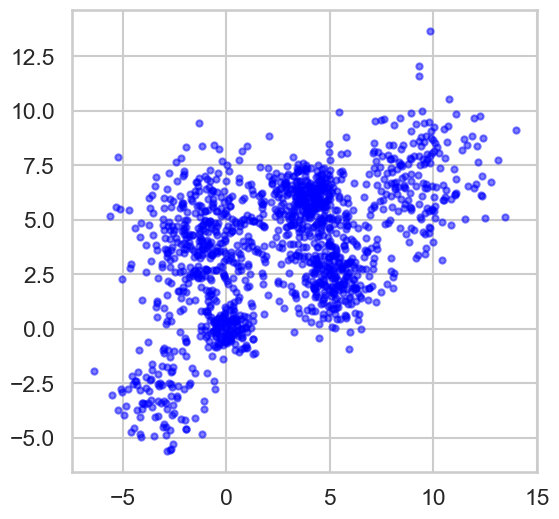

In [3]:
#Data Generation and Visualization
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data. 
* Display the outcome of each value of K. 
* Plot distortion function versus K and choose the approriate value of K. 
* Plot the silhouette_score versus K and use it to choose the best K. 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 
* Comment on the effect of centroid initialization on cluster assignment. 
* Hint: Lookup k-means++ .

Clustering for K=2


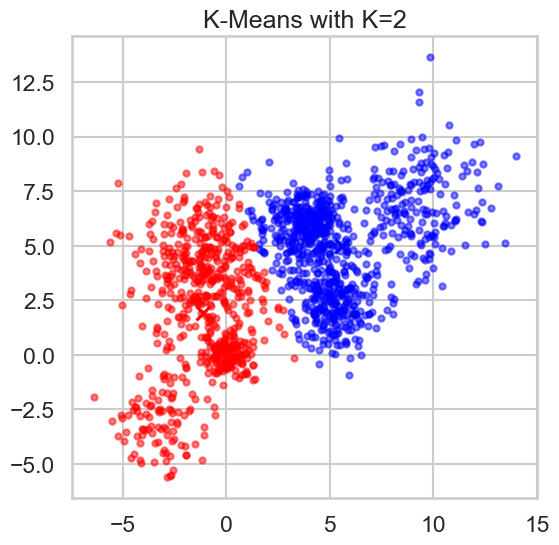

Clustering for K=3


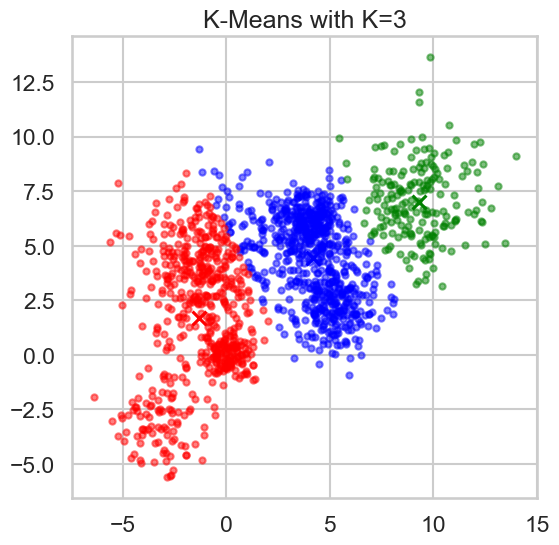

Clustering for K=4


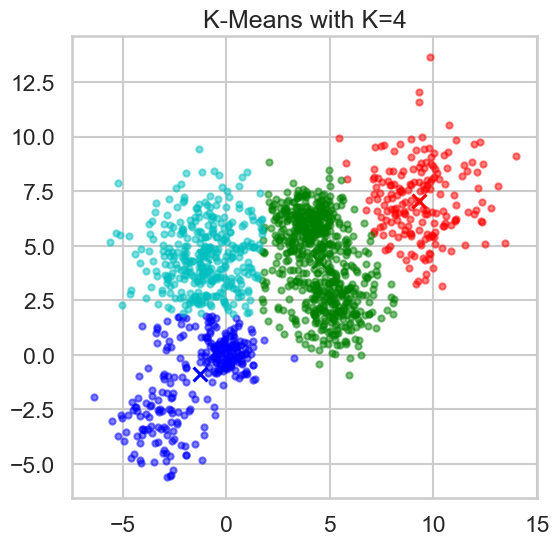

Clustering for K=5


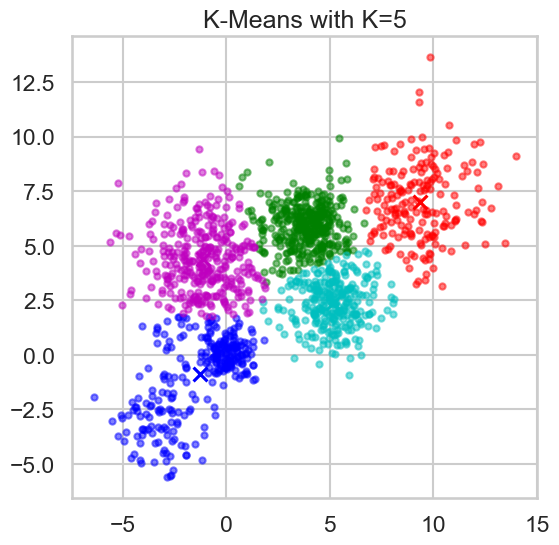

Clustering for K=6


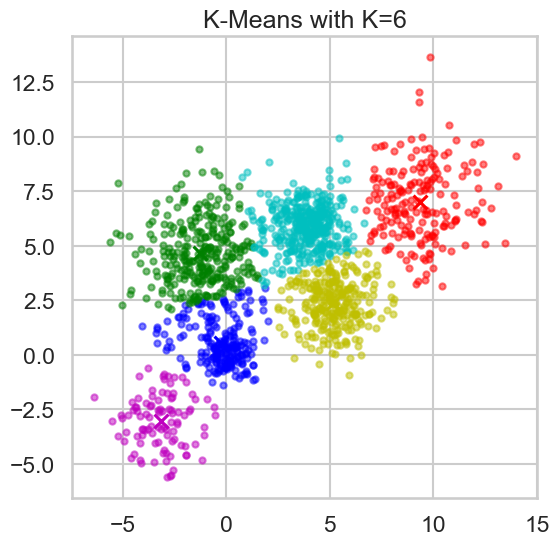

Clustering for K=7


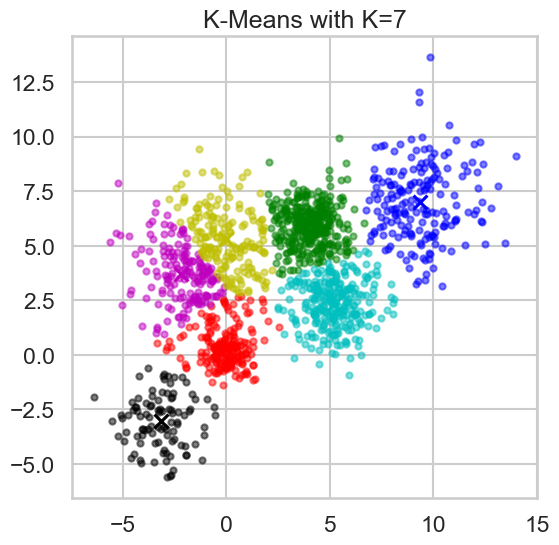

Clustering for K=8


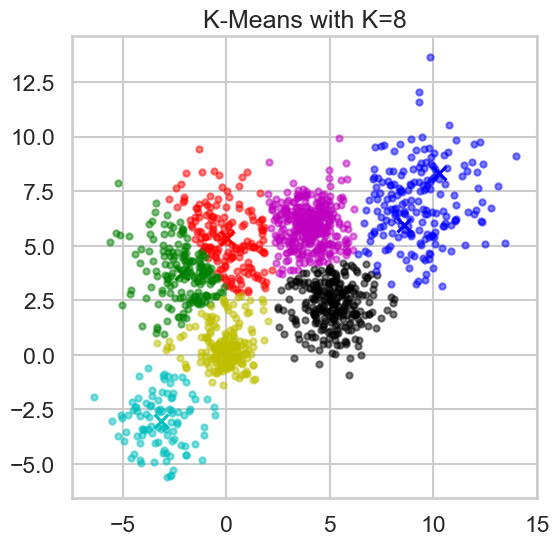

Clustering for K=9


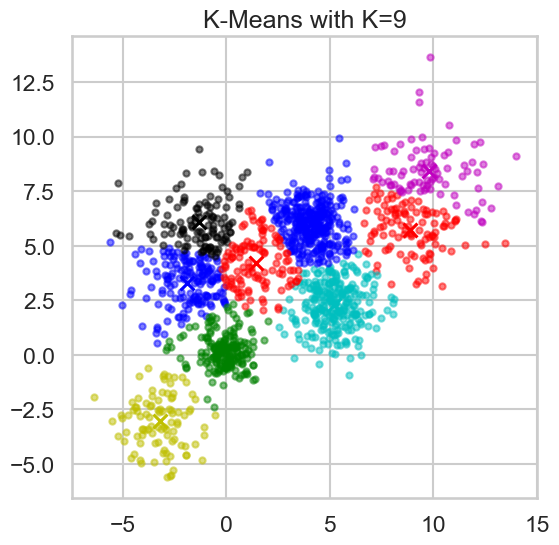

Clustering for K=10


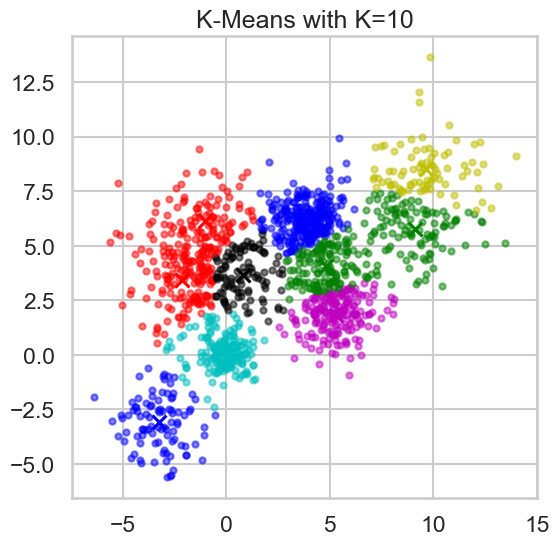

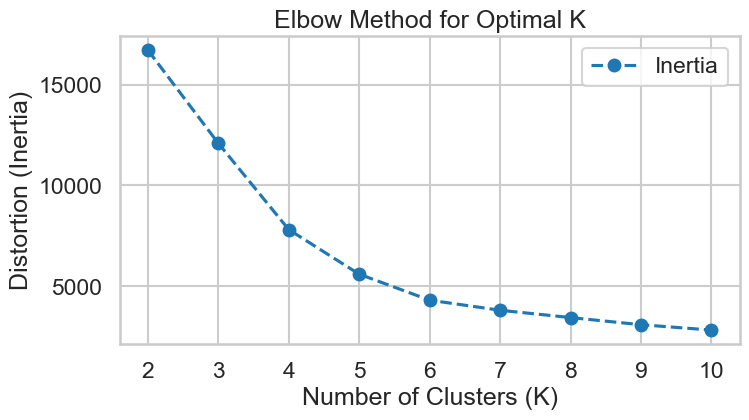

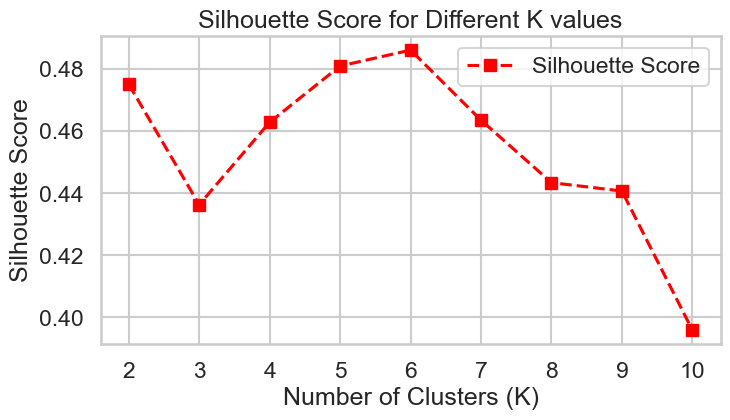

Best K based on silhouette score: 6
Silhouette Score for best K: 0.4861


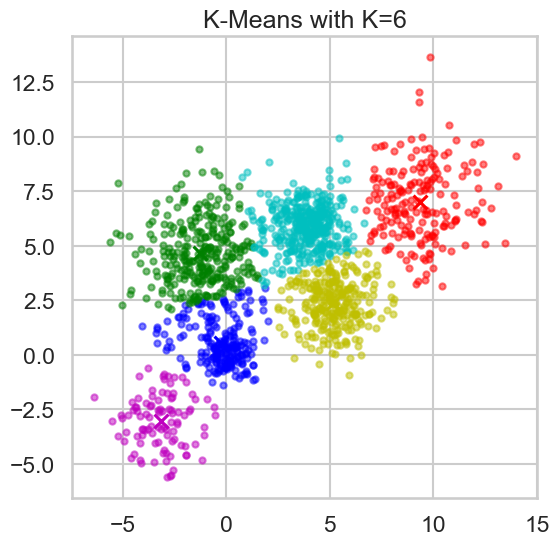

The k-means++ initialization helps prevent poor cluster assignment by placing initial centroids far apart, reducing the likelihood of convergence to a suboptimal solution.


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Define range of K values to test
K_values = range(2, 11)

# Lists to store metrics
distortions = []
silhouette_scores = []

# Function to display clusters
def display_cluster(X, km, num_clusters):
    color = 'brgcmyk'  # Color list (supports up to 7 clusters)
    alpha = 0.5
    s = 20

    plt.figure(figsize=(6, 6))
    
    for i in range(num_clusters):
        plt.scatter(X[km.labels_ == i, 0], X[km.labels_ == i, 1], c=color[i % len(color)], alpha=alpha, s=s)
        plt.scatter(km.cluster_centers_[i][0], km.cluster_centers_[i][1], c=color[i % len(color)], marker='x', s=100)
    
    plt.title(f"K-Means with K={num_clusters}")
    plt.show()

# Loop over K values
best_K = None
best_silhouette = -1

for k in K_values:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(Multi_blob_Data)

    # Compute evaluation metrics
    distortions.append(kmeans.inertia_)
    silhouette_avg = silhouette_score(Multi_blob_Data, labels)
    silhouette_scores.append(silhouette_avg)
    
    # Update best K if silhouette score improves
    if silhouette_avg > best_silhouette:
        best_silhouette = silhouette_avg
        best_K = k
    
    # Display clustering output for each K
    print(f"Clustering for K={k}")
    display_cluster(Multi_blob_Data, kmeans, k)

# Plot Elbow Method
plt.figure(figsize=(8, 4))
plt.plot(K_values, distortions, marker='o', linestyle='--', label="Inertia")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Distortion (Inertia)")
plt.title("Elbow Method for Optimal K")
plt.legend()
plt.grid(True)
plt.show()

# Plot silhouette scores
plt.figure(figsize=(8, 4))
plt.plot(K_values, silhouette_scores, marker='s', linestyle='--', color='red', label="Silhouette Score")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score for Different K values")
plt.legend()
plt.grid(True)
plt.show()

# Print best K based on silhouette score
print(f"Best K based on silhouette score: {best_K}")
print(f"Silhouette Score for best K: {best_silhouette:.4f}")

# Run K-Means with the best K
final_kmeans = KMeans(n_clusters=best_K, init='k-means++', random_state=42)
final_labels = final_kmeans.fit_predict(Multi_blob_Data)

# Final clustering visualization
display_cluster(Multi_blob_Data, final_kmeans, best_K)

# Comment on centroid initialization
print("The k-means++ initialization helps prevent poor cluster assignment by placing initial centroids far apart, reducing the likelihood of convergence to a suboptimal solution.")


### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data.
* In the  AgglomerativeClustering change the following parameters:
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage(try different options)
    * Distance_threshold (try different options)
* Plot the dendrograph for one trial.
* For each of these trials, calculate the silhouette_score and display the resulting clusters.  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation.

Affinity: euclidean, Linkage: ward, Threshold: 1, Clusters: 257, Silhouette Score: 0.3843


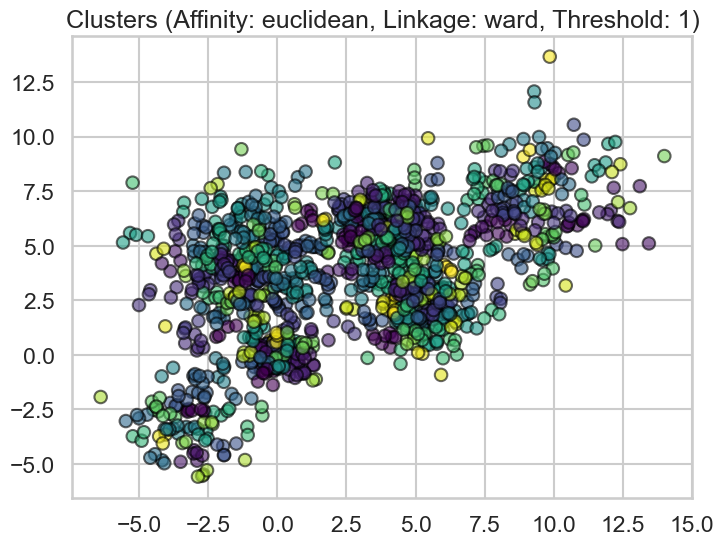

Affinity: euclidean, Linkage: ward, Threshold: 2, Clusters: 138, Silhouette Score: 0.3601


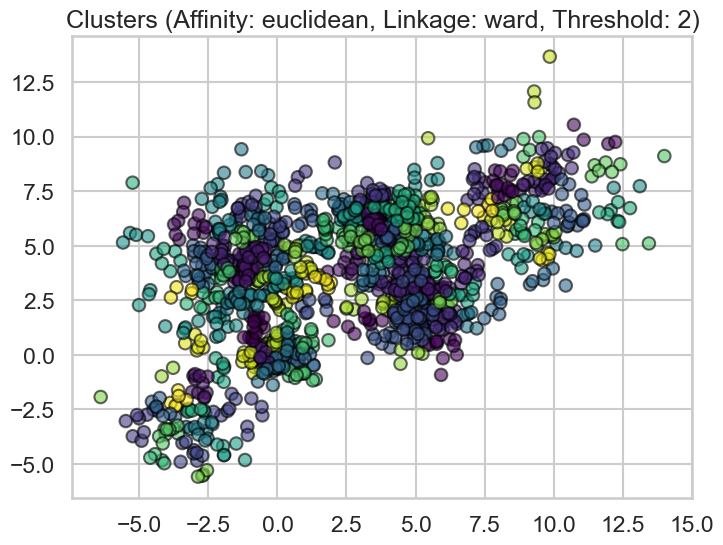

Affinity: euclidean, Linkage: ward, Threshold: 3, Clusters: 94, Silhouette Score: 0.3385


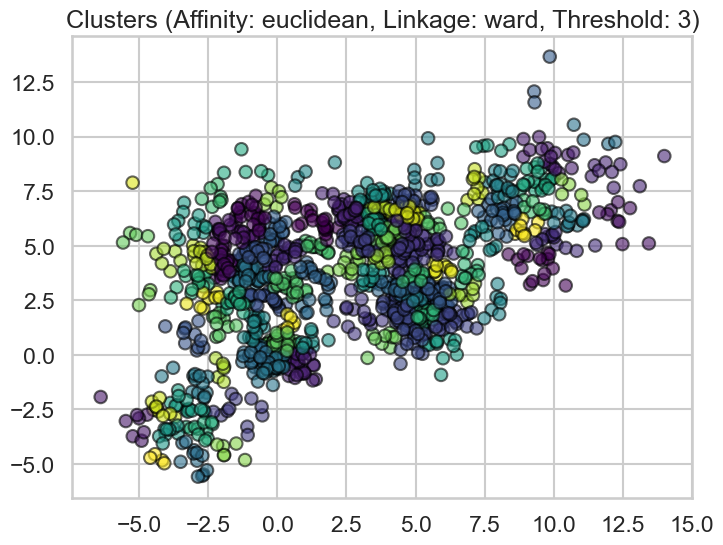

Affinity: euclidean, Linkage: ward, Threshold: 4, Clusters: 72, Silhouette Score: 0.3296


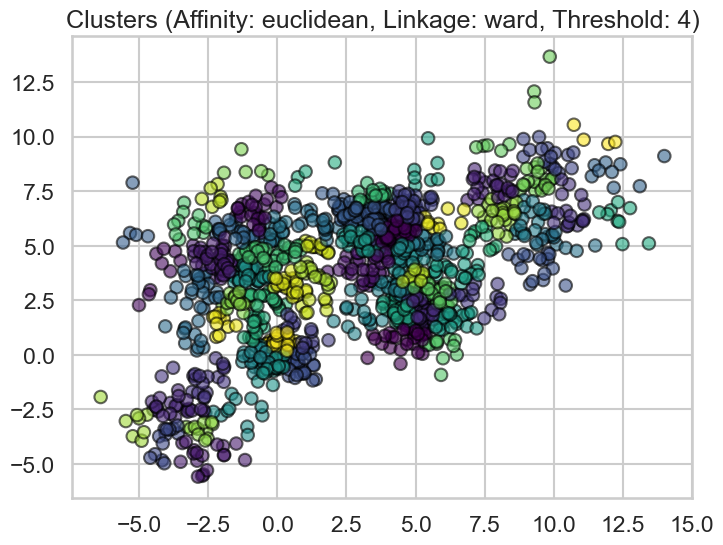

Affinity: euclidean, Linkage: ward, Threshold: 5, Clusters: 56, Silhouette Score: 0.3196


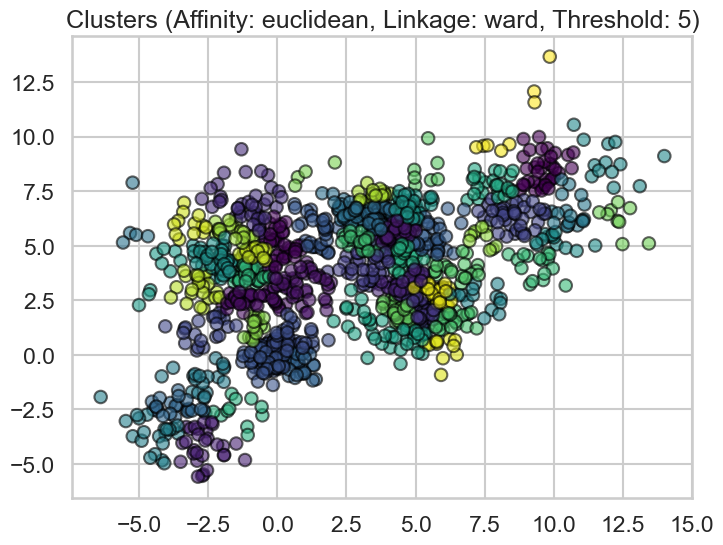

Affinity: euclidean, Linkage: ward, Threshold: 6, Clusters: 46, Silhouette Score: 0.3088


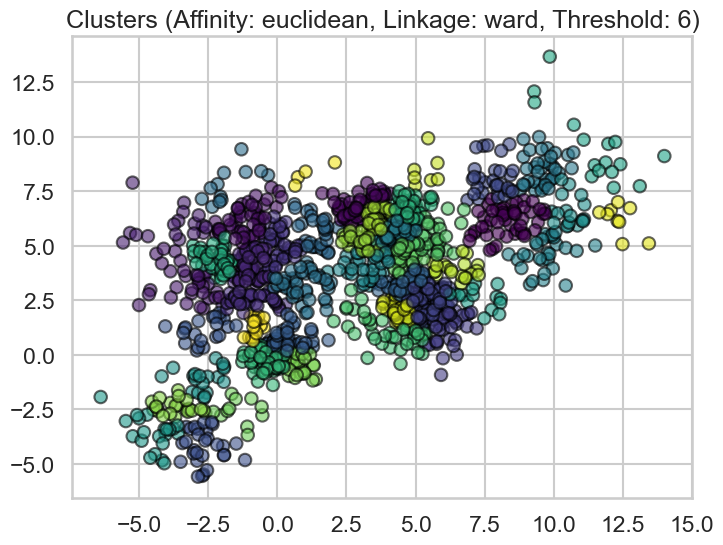

Affinity: euclidean, Linkage: complete, Threshold: 1, Clusters: 209, Silhouette Score: 0.3467


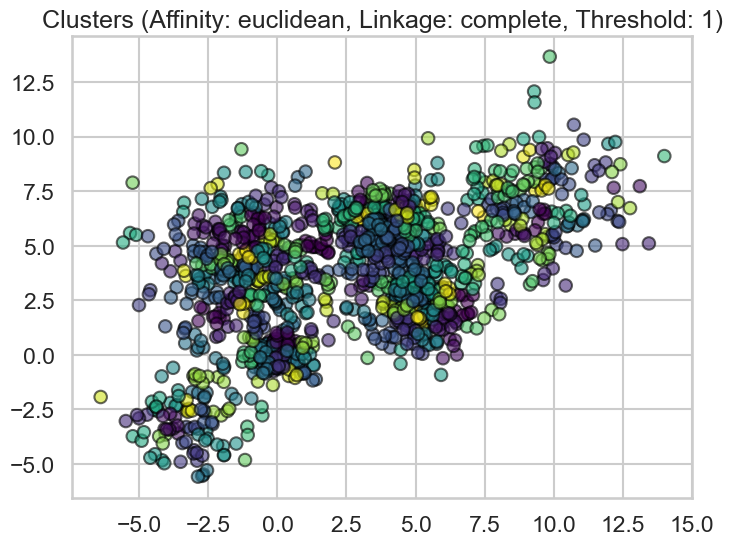

Affinity: euclidean, Linkage: complete, Threshold: 2, Clusters: 85, Silhouette Score: 0.2927


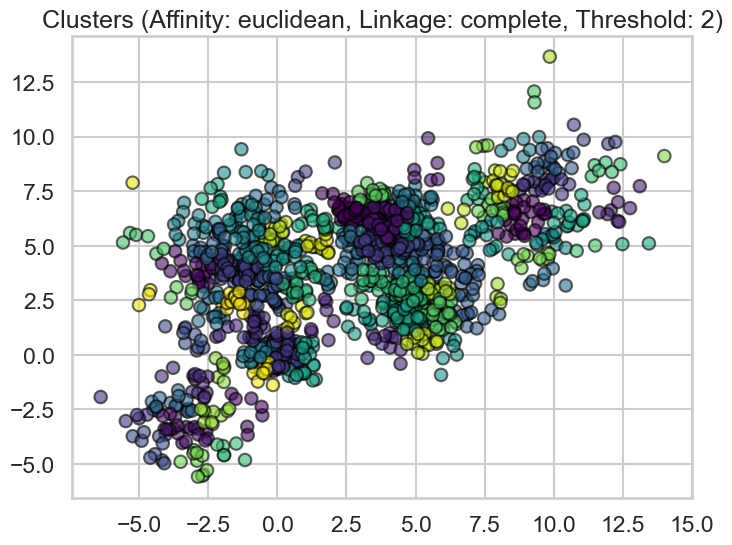

Affinity: euclidean, Linkage: complete, Threshold: 3, Clusters: 47, Silhouette Score: 0.2896


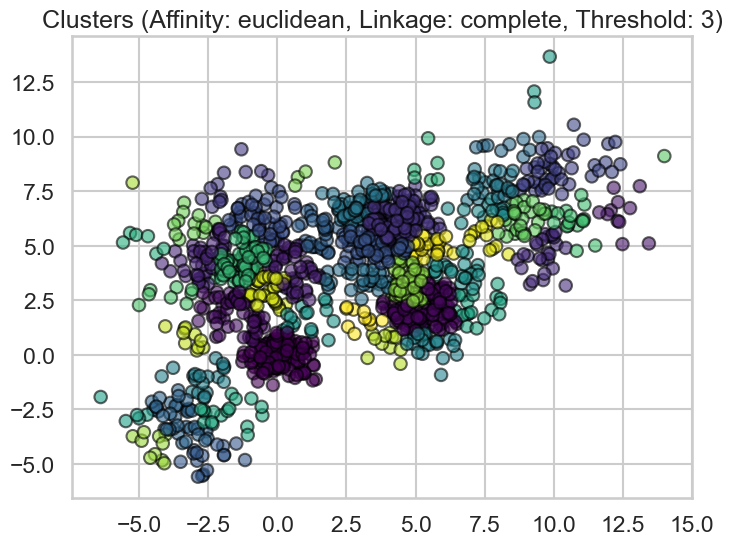

Affinity: euclidean, Linkage: complete, Threshold: 4, Clusters: 29, Silhouette Score: 0.2870


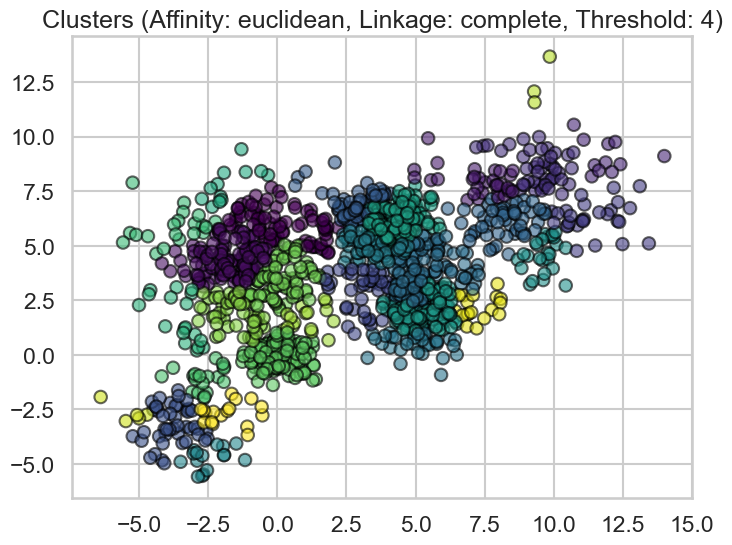

Affinity: euclidean, Linkage: complete, Threshold: 5, Clusters: 22, Silhouette Score: 0.3046


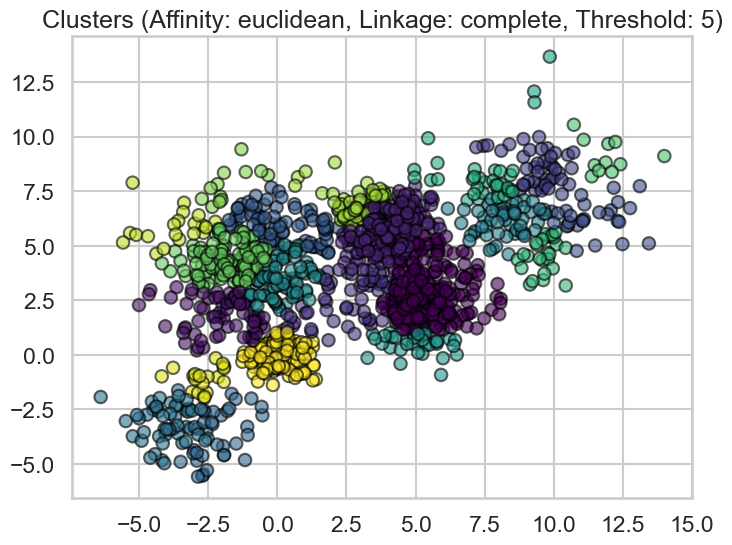

Affinity: euclidean, Linkage: complete, Threshold: 6, Clusters: 15, Silhouette Score: 0.3278


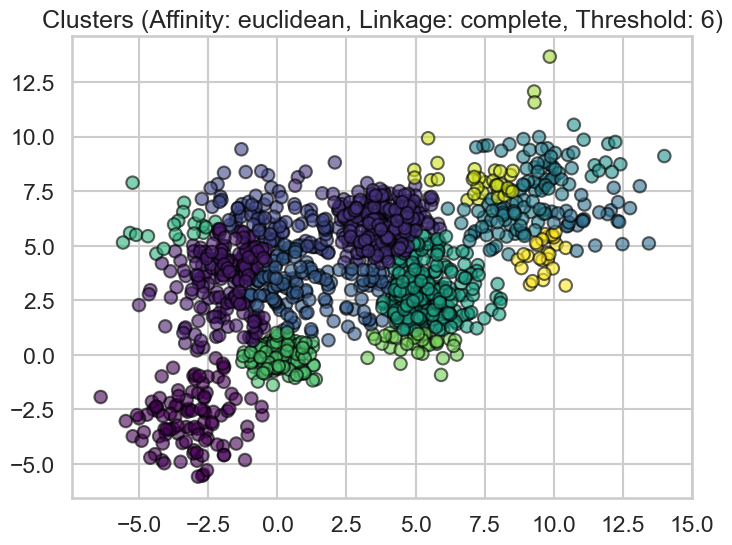

Affinity: euclidean, Linkage: average, Threshold: 1, Clusters: 115, Silhouette Score: 0.3238


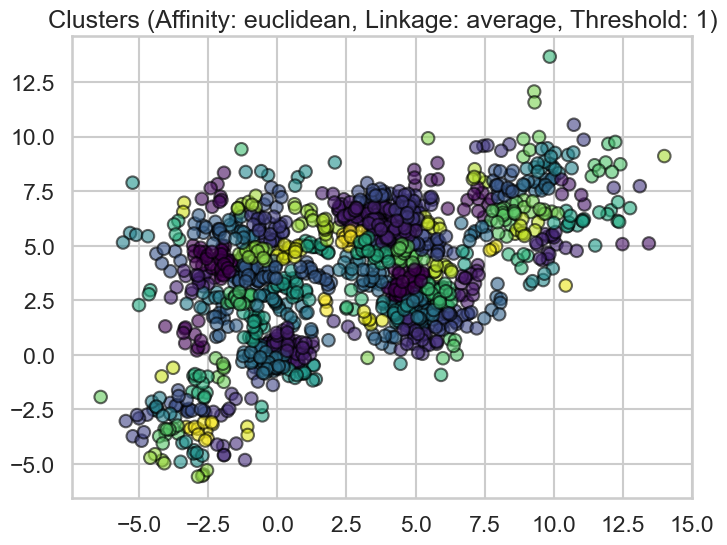

Affinity: euclidean, Linkage: average, Threshold: 2, Clusters: 36, Silhouette Score: 0.3156


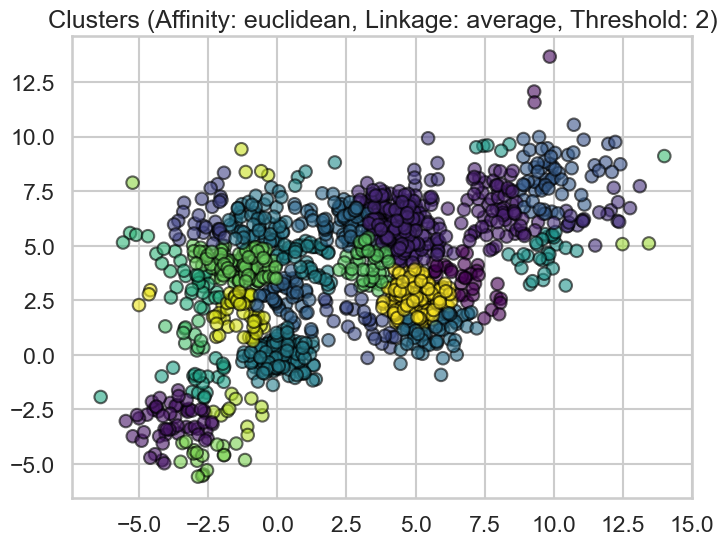

Affinity: euclidean, Linkage: average, Threshold: 3, Clusters: 16, Silhouette Score: 0.3550


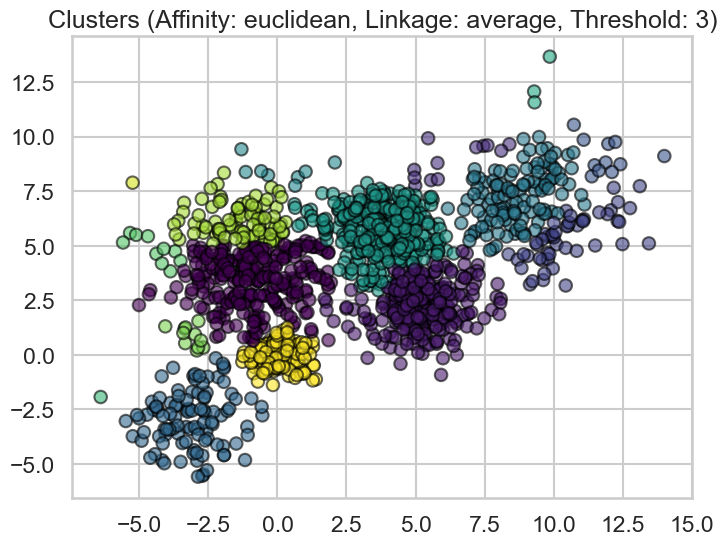

Affinity: euclidean, Linkage: average, Threshold: 4, Clusters: 10, Silhouette Score: 0.3738


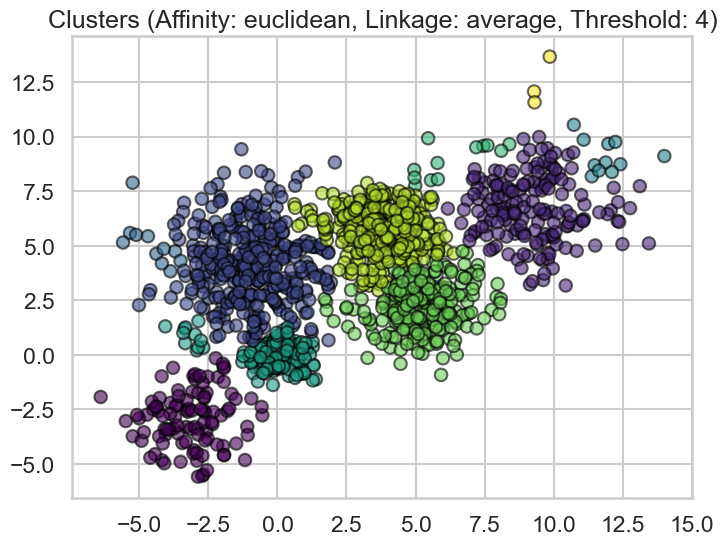

Affinity: euclidean, Linkage: average, Threshold: 5, Clusters: 5, Silhouette Score: 0.4332


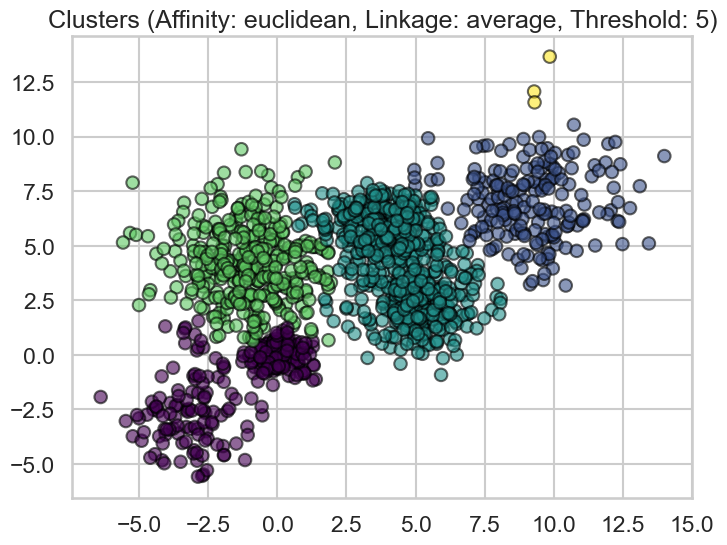

Affinity: euclidean, Linkage: average, Threshold: 6, Clusters: 3, Silhouette Score: 0.4308


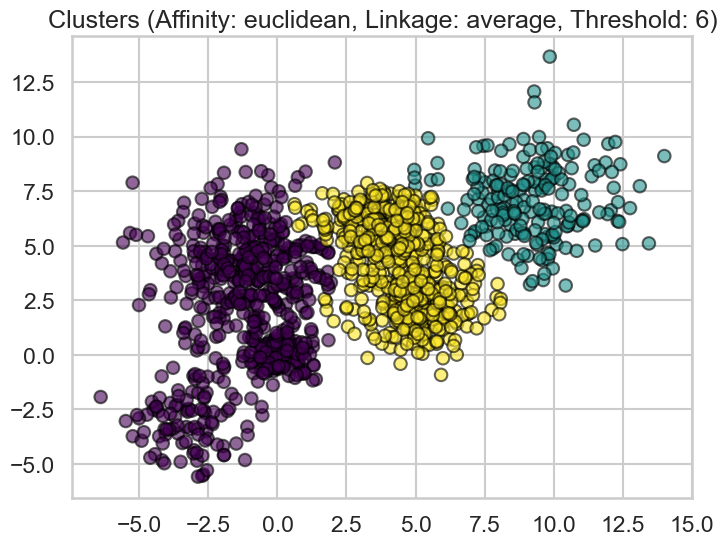

Affinity: euclidean, Linkage: single, Threshold: 1, Clusters: 9, Silhouette Score: -0.1494


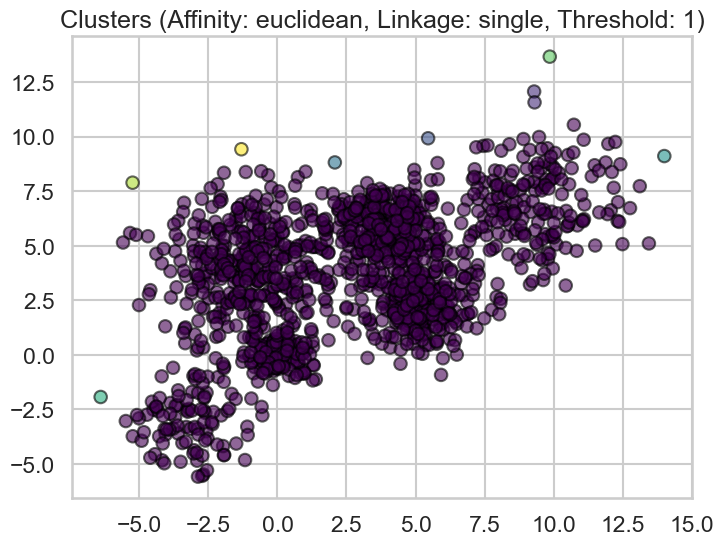

Affinity: euclidean, Linkage: single, Threshold: 2, Clusters: 2, Silhouette Score: 0.3218


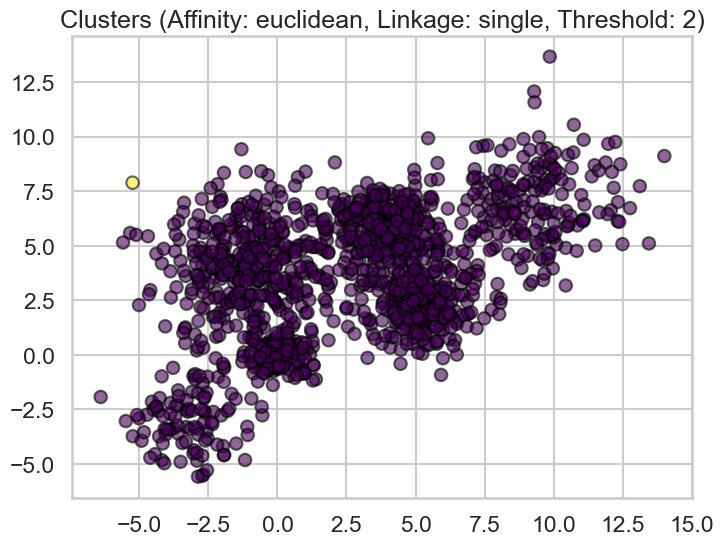

Skipping: Only 1 cluster formed (Affinity: euclidean, Linkage: single, Threshold: 3)
Skipping: Only 1 cluster formed (Affinity: euclidean, Linkage: single, Threshold: 4)
Skipping: Only 1 cluster formed (Affinity: euclidean, Linkage: single, Threshold: 5)
Skipping: Only 1 cluster formed (Affinity: euclidean, Linkage: single, Threshold: 6)
Skipping: Ward linkage only works with Euclidean distance (manhattan used).
Affinity: manhattan, Linkage: complete, Threshold: 1, Clusters: 281, Silhouette Score: 0.3486


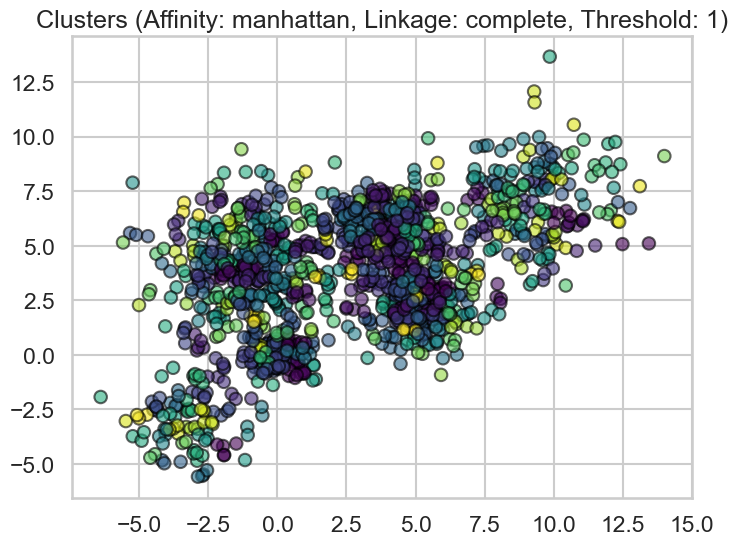

Affinity: manhattan, Linkage: complete, Threshold: 2, Clusters: 126, Silhouette Score: 0.3229


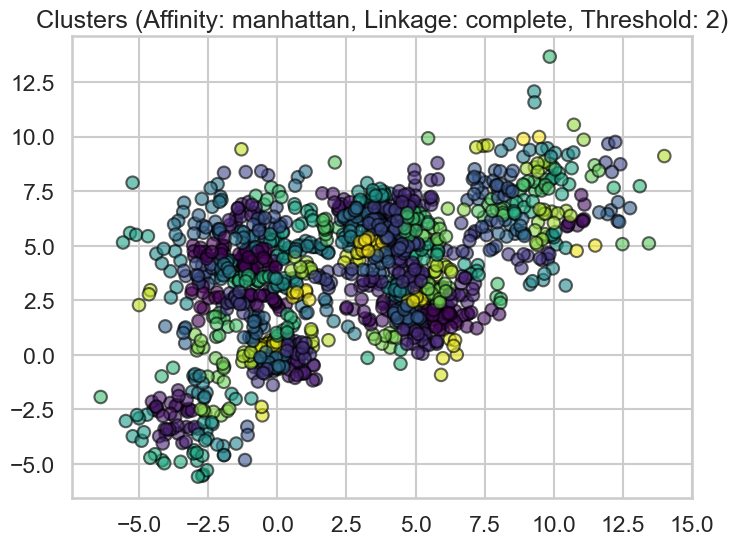

Affinity: manhattan, Linkage: complete, Threshold: 3, Clusters: 72, Silhouette Score: 0.2639


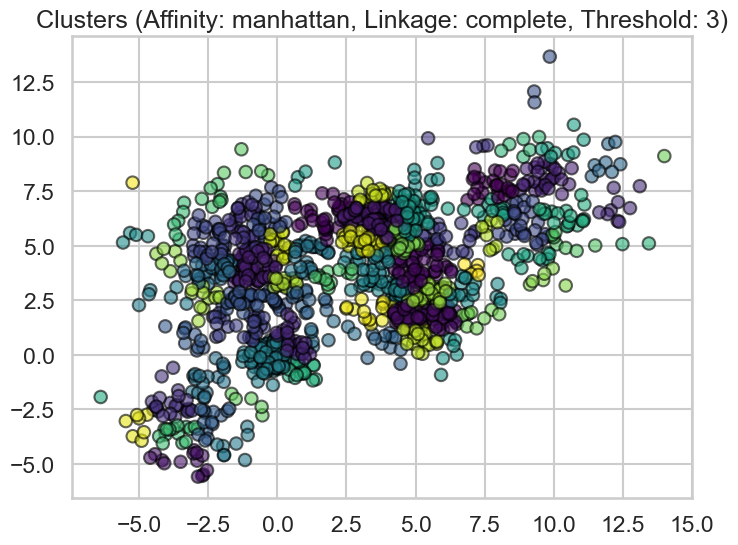

Affinity: manhattan, Linkage: complete, Threshold: 4, Clusters: 43, Silhouette Score: 0.2763


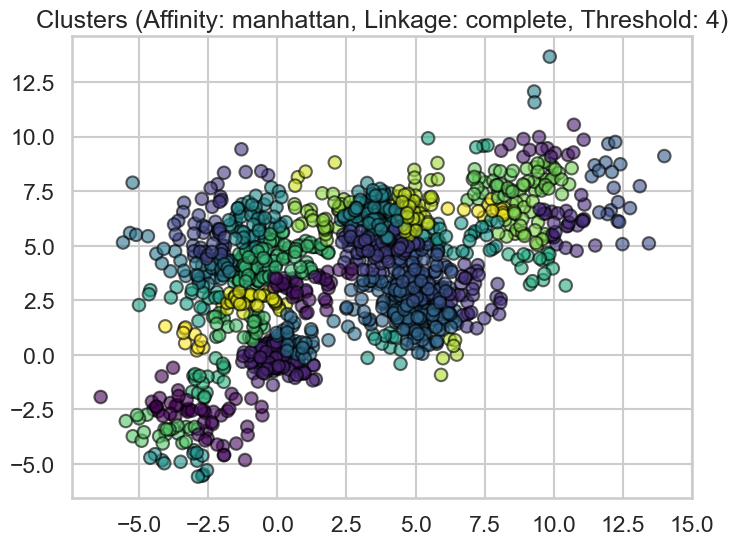

Affinity: manhattan, Linkage: complete, Threshold: 5, Clusters: 33, Silhouette Score: 0.2814


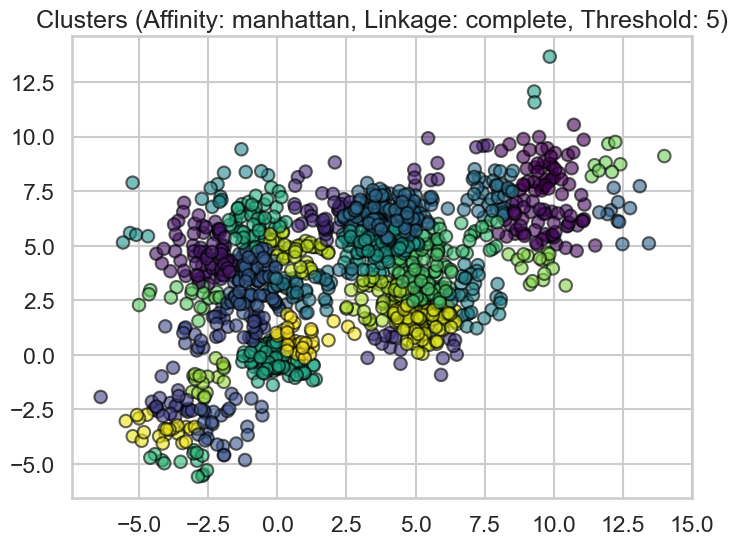

Affinity: manhattan, Linkage: complete, Threshold: 6, Clusters: 26, Silhouette Score: 0.2732


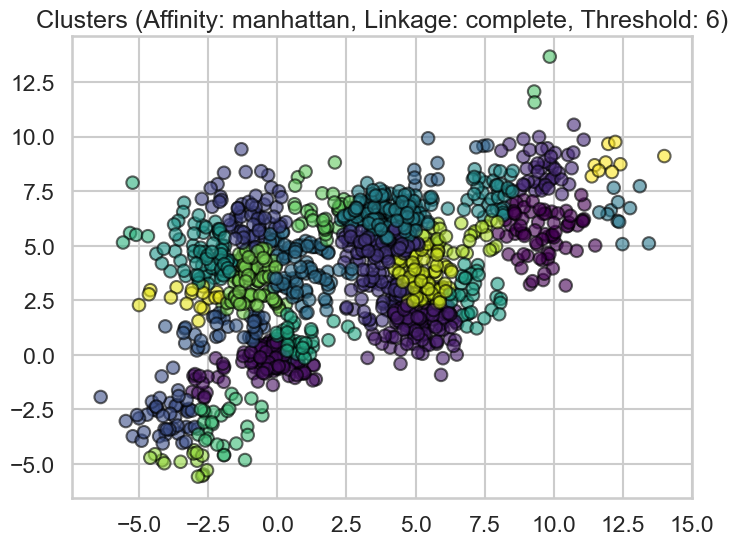

Affinity: manhattan, Linkage: average, Threshold: 1, Clusters: 166, Silhouette Score: 0.3409


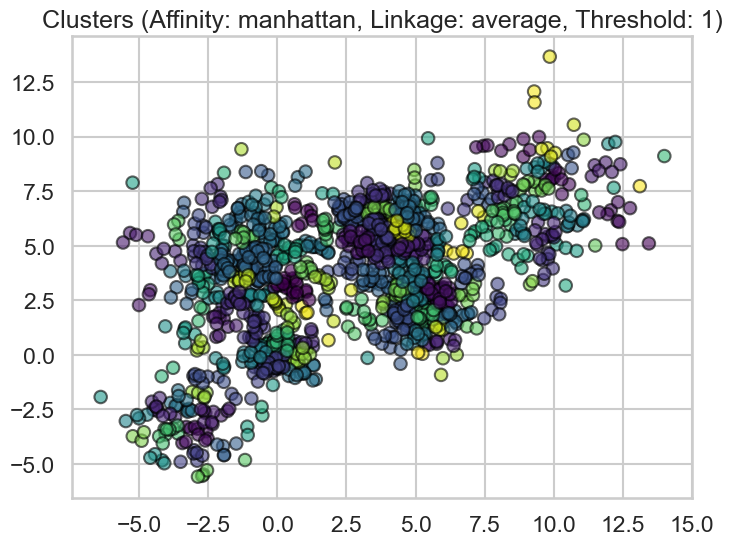

Affinity: manhattan, Linkage: average, Threshold: 2, Clusters: 53, Silhouette Score: 0.2781


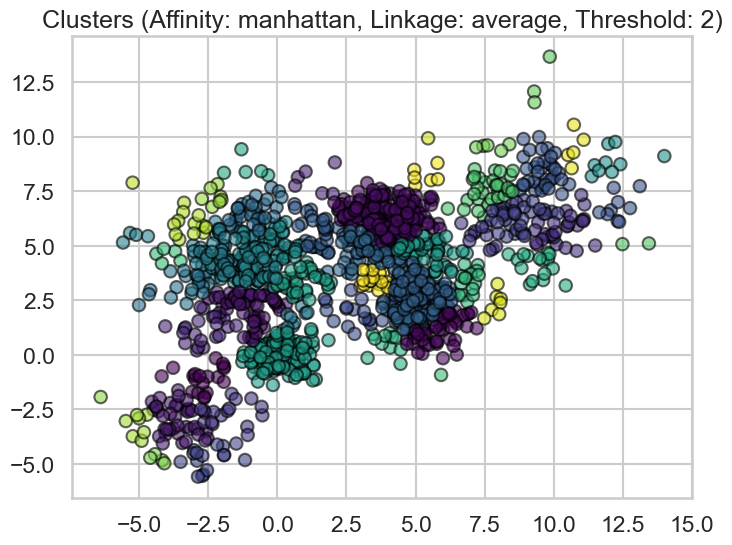

Affinity: manhattan, Linkage: average, Threshold: 3, Clusters: 25, Silhouette Score: 0.2962


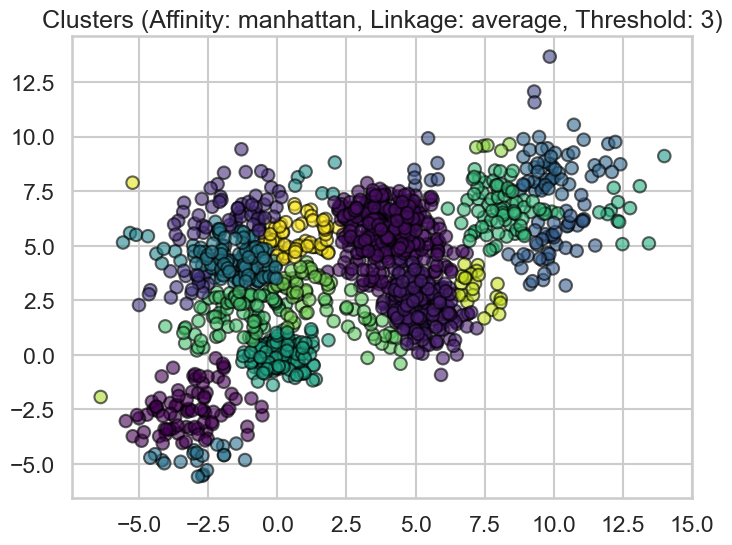

Affinity: manhattan, Linkage: average, Threshold: 4, Clusters: 16, Silhouette Score: 0.3332


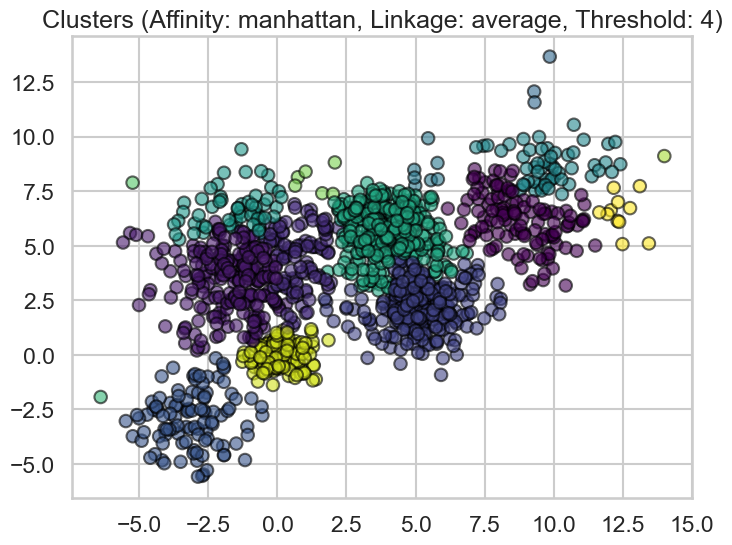

Affinity: manhattan, Linkage: average, Threshold: 5, Clusters: 9, Silhouette Score: 0.3996


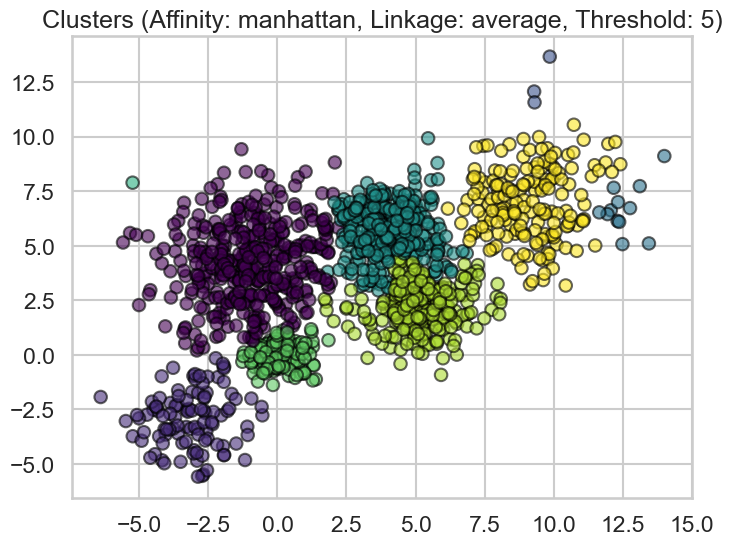

Affinity: manhattan, Linkage: average, Threshold: 6, Clusters: 6, Silhouette Score: 0.3803


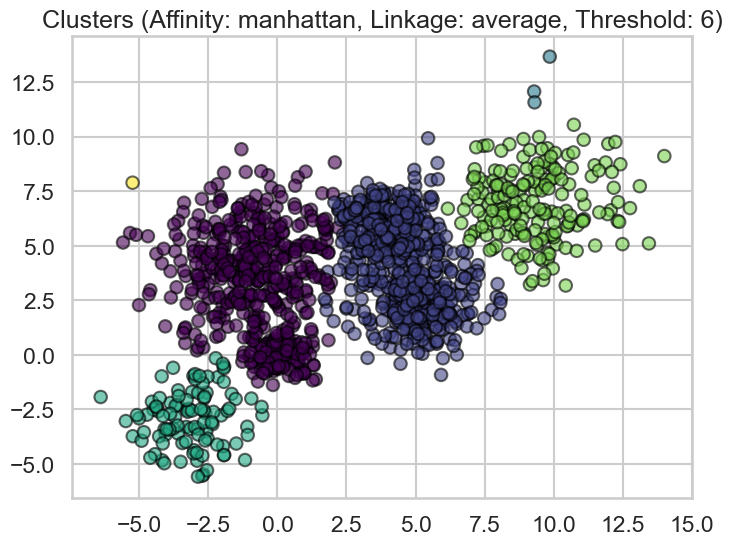

Affinity: manhattan, Linkage: single, Threshold: 1, Clusters: 16, Silhouette Score: -0.4080


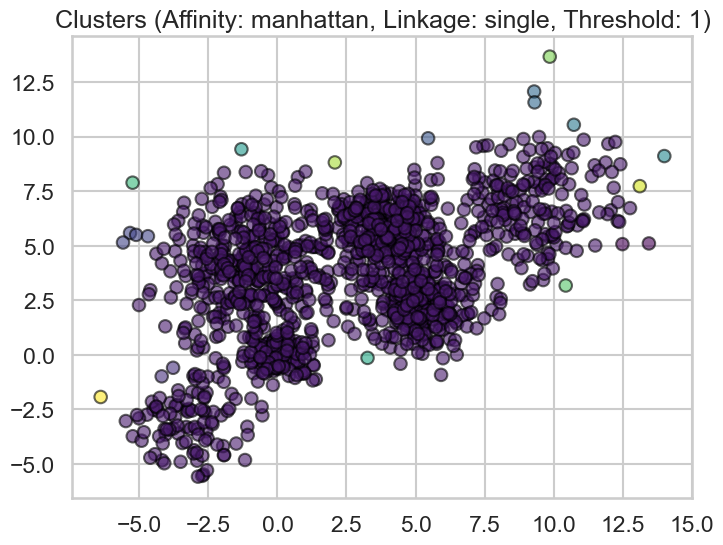

Affinity: manhattan, Linkage: single, Threshold: 2, Clusters: 4, Silhouette Score: 0.1487


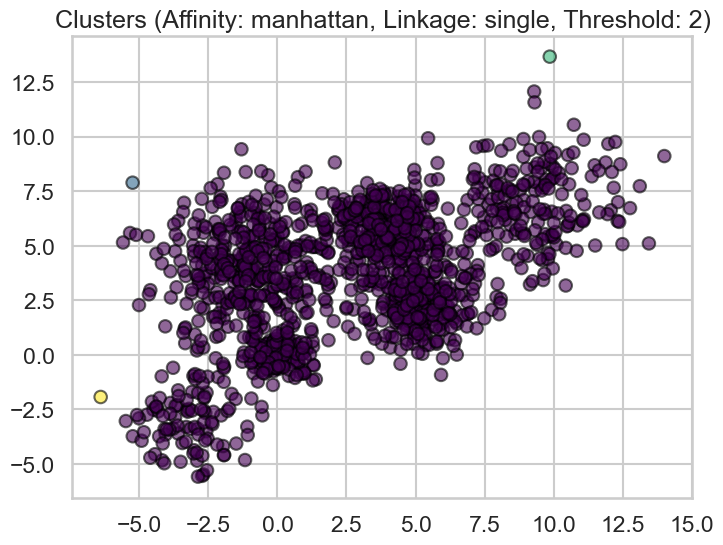

Skipping: Only 1 cluster formed (Affinity: manhattan, Linkage: single, Threshold: 3)
Skipping: Only 1 cluster formed (Affinity: manhattan, Linkage: single, Threshold: 4)
Skipping: Only 1 cluster formed (Affinity: manhattan, Linkage: single, Threshold: 5)
Skipping: Only 1 cluster formed (Affinity: manhattan, Linkage: single, Threshold: 6)
Skipping: Ward linkage only works with Euclidean distance (cosine used).
Affinity: cosine, Linkage: complete, Threshold: 1, Clusters: 6, Silhouette Score: 0.1885


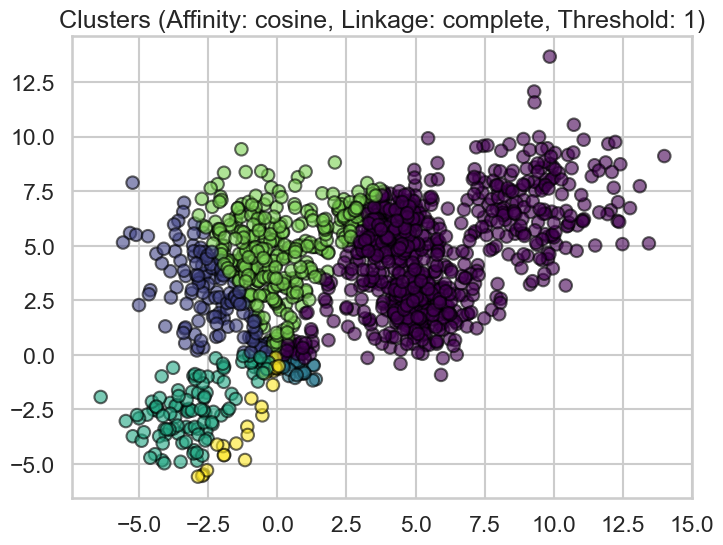

Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: complete, Threshold: 2)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: complete, Threshold: 3)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: complete, Threshold: 4)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: complete, Threshold: 5)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: complete, Threshold: 6)
Affinity: cosine, Linkage: average, Threshold: 1, Clusters: 2, Silhouette Score: 0.3525


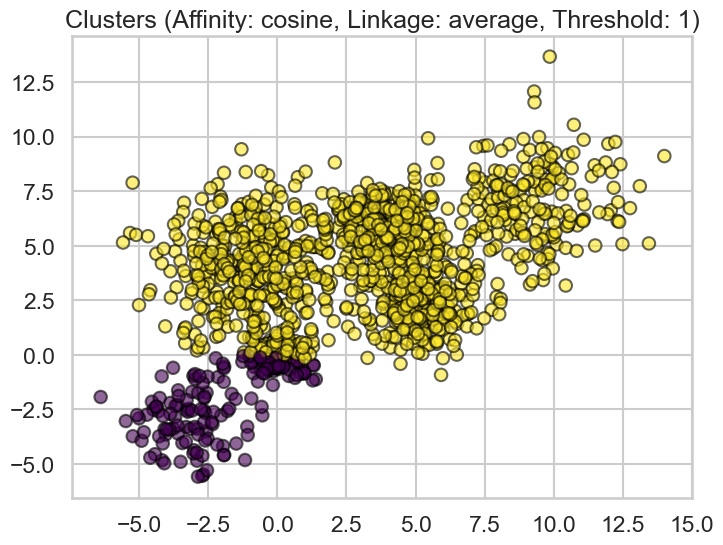

Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: average, Threshold: 2)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: average, Threshold: 3)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: average, Threshold: 4)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: average, Threshold: 5)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: average, Threshold: 6)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: single, Threshold: 1)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: single, Threshold: 2)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: single, Threshold: 3)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: single, Threshold: 4)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: single, Threshold: 5)
Skipping: Only 1 cluster formed (Affinity: cosine, Linkage: single, Threshold: 6)

Best Parameters: {'Affinity': 'euclidean', 'Linkage': 'average', 'Threshold': 5}
Best Silhou

In [5]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs


#ya el distance of thresshold ya el num of clusters

# Define different clustering parameters to try
affinities = ["euclidean", "manhattan", "cosine"]
linkages = ["ward", "complete", "average", "single"]
distance_thresholds = [1,2,3,4,5,6]  

best_score = -1
best_params = {}
best_labels = None
best_k = 0  # Best number of clusters

# Function to plot clustering results
def plot_clusters(data, labels, title):
    plt.figure(figsize=(8, 6))
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap="viridis", edgecolors="k", alpha=0.6)
    plt.title(title)
    plt.show()

# Iterate through combinations of parameters
for affinity in affinities:
    for linkage_method in linkages:
        if linkage_method == "ward" and affinity != "euclidean":
            print(f"Skipping: Ward linkage only works with Euclidean distance ({affinity} used).")
            continue
        
        for threshold in distance_thresholds:
            try:
                clustering = AgglomerativeClustering(n_clusters=None, 
                                                     affinity=affinity, 
                                                     linkage=linkage_method, 
                                                     distance_threshold=threshold)
                
                labels = clustering.fit_predict(Multi_blob_Data)

                # Get unique clusters (excluding noise, if any)
                unique_labels = set(labels)
                n_clusters = len(unique_labels)

                # Skip configurations forming only one cluster
                if n_clusters == 1:
                    print(f"Skipping: Only 1 cluster formed (Affinity: {affinity}, Linkage: {linkage_method}, Threshold: {threshold})")
                    continue

                # Calculate silhouette score
                silhouette_avg = silhouette_score(Multi_blob_Data, labels)
                print(f"Affinity: {affinity}, Linkage: {linkage_method}, Threshold: {threshold}, Clusters: {n_clusters}, Silhouette Score: {silhouette_avg:.4f}")

                # Plot clustering results
                plot_clusters(Multi_blob_Data, labels, 
                              title=f"Clusters (Affinity: {affinity}, Linkage: {linkage_method}, Threshold: {threshold})")

                # Store the best parameters
                if silhouette_avg > best_score:
                    best_score = silhouette_avg
                    best_params = {
                        "Affinity": affinity,
                        "Linkage": linkage_method,
                        "Threshold": threshold
                    }
                    best_labels = labels
                    best_k = n_clusters  # Store the best number of clusters

            except Exception as e:
                print(f"Error for {affinity}, {linkage_method}, {threshold}: {e}")


# Print best parameters and silhouette score
print("\nBest Parameters:", best_params)
print("Best Silhouette Score:", round(best_score, 4))
print("Best Number of Clusters (K):", best_k)


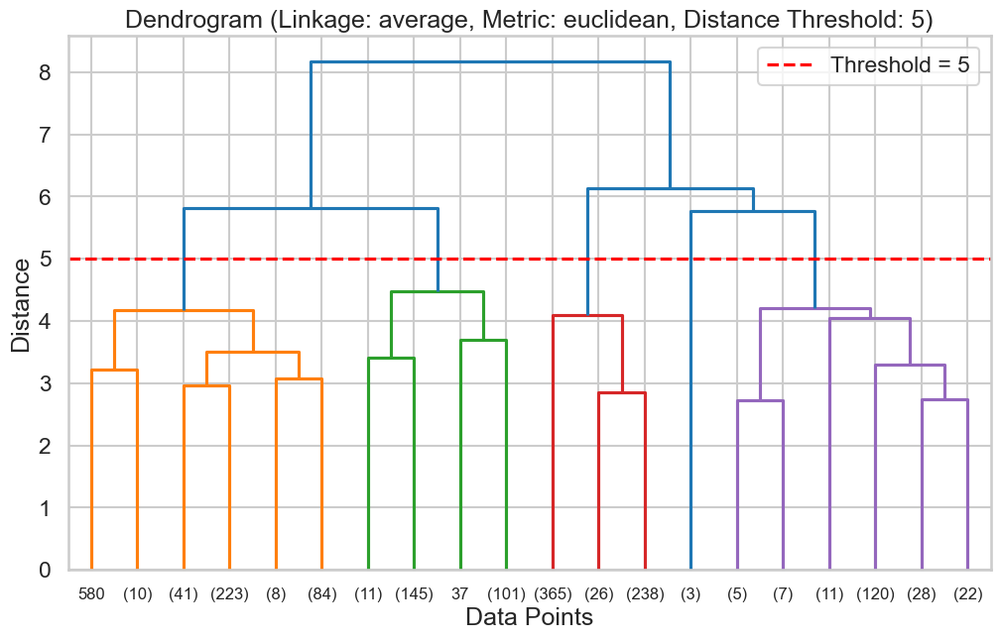

In [6]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Function to plot dendrogram for the best model
def plot_best_dendrogram(data, best_params):
    Z = linkage(data, method=best_params['Linkage'], metric=best_params['Affinity'])

    plt.figure(figsize=(12, 7))
    plt.title(f"Dendrogram (Linkage: {best_params['Linkage']}, Metric: {best_params['Affinity']}, Distance Threshold: {best_params['Threshold']})")
    plt.xlabel("Data Points")
    plt.ylabel("Distance")

    # Plot dendrogram with color threshold and truncate for better visualization
    dendrogram(Z, color_threshold=best_params['Threshold'], truncate_mode='lastp', p=20)
    
    # Add a red dashed line for the best distance threshold
    plt.axhline(y=best_params['Threshold'], color='red', linestyle='--', label=f"Threshold = {best_params['Threshold']}")
    plt.legend()

    plt.show()

# Call the function with the best parameters
plot_best_dendrogram(Multi_blob_Data, best_params)


### DBScan
* Use DBScan function to  to cluster the above data. 
* In the  DBscan change the following parameters: 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
    * Another option: Lookup K-Distance graph method
* Plot the silhouette_score versus the variation in the EPS and the min_samples.
* Plot the resulting Clusters in this case. 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments. 

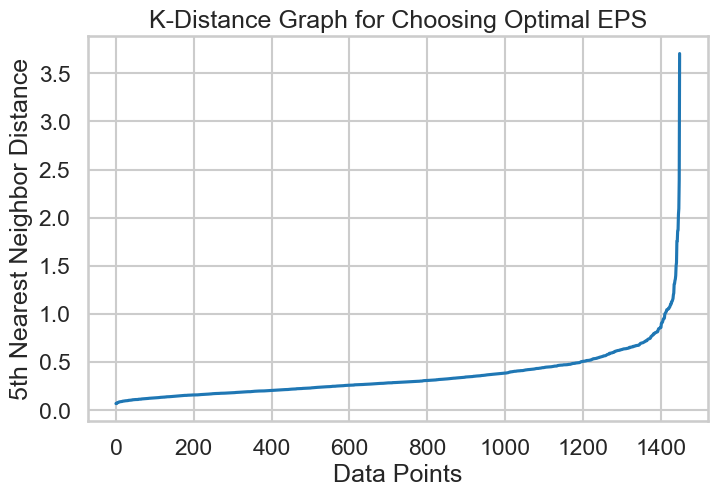

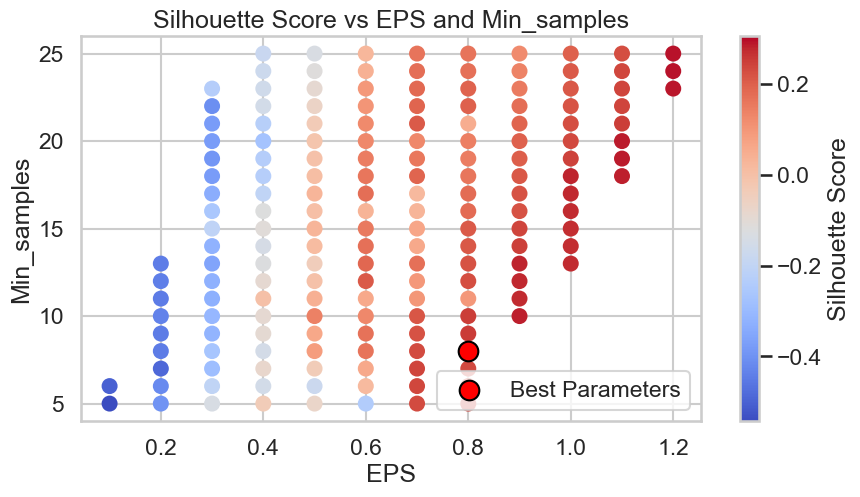

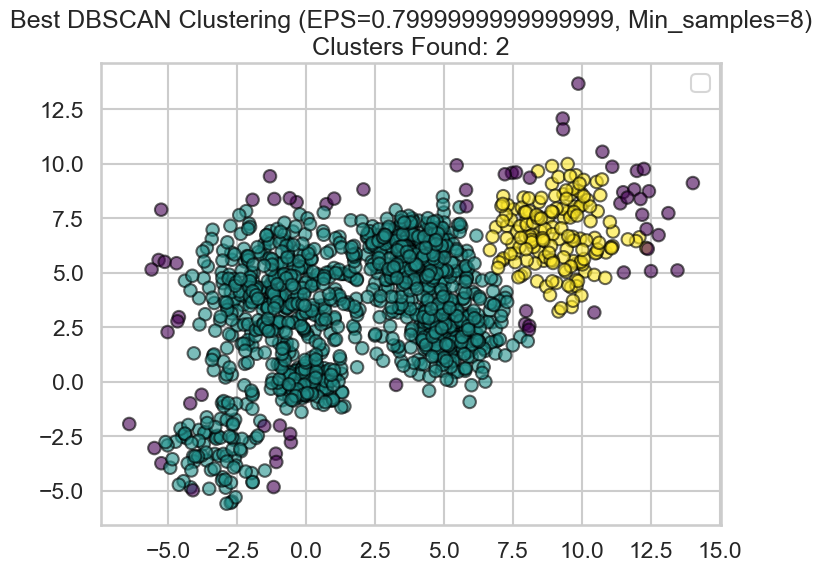


Best Parameters: {'EPS': 0.7999999999999999, 'Min_samples': 8}
Best Silhouette Score: 0.3052
Best Number of Clusters Found: 2


In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.neighbors import NearestNeighbors


# Define DBSCAN parameter ranges
eps_values = np.linspace(0.1, 3, 30)  # EPS from 0.1 to 3
min_samples_values = np.arange(5, 26, 1)  # Min_samples from 5 to 25

# Initialize variables for storing best results
best_score = -1
best_params = {}
best_labels = None  # Initialize properly
best_n_clusters = 0  # To store best number of clusters
silhouette_scores = []

# Compute K-Distance graph for optimal EPS (before using DBSCAN)
nearest_neighbors = NearestNeighbors(n_neighbors=5)
nearest_neighbors.fit(Multi_blob_Data)
distances, indices = nearest_neighbors.kneighbors(Multi_blob_Data)
k_distances = np.sort(distances[:, -1])  # Sort distances for the 5th nearest neighbor

# Plot the K-Distance graph to choose optimal EPS
plt.figure(figsize=(8, 5))
plt.plot(k_distances)
plt.xlabel("Data Points")
plt.ylabel("5th Nearest Neighbor Distance")
plt.title("K-Distance Graph for Choosing Optimal EPS")
plt.show()

# Iterate through different parameter combinations for DBSCAN
for eps in eps_values:
    for min_samples in min_samples_values:
        db = DBSCAN(eps=eps, min_samples=min_samples)
        labels = db.fit_predict(Multi_blob_Data)

        # Get unique cluster labels (excluding noise points labeled as -1)
        unique_labels = set(labels) - {-1}
        n_clusters = len(unique_labels)

        # Ensure at least 2 clusters exist
        if n_clusters < 2:
            continue

        # Compute silhouette score
        score = silhouette_score(Multi_blob_Data, labels)
        silhouette_scores.append((eps, min_samples, score))

        # Update best parameters if the score is better
        if score > best_score:
            best_score = score
            best_params = {"EPS": eps, "Min_samples": min_samples}
            best_labels = labels  # Save best labels for visualization
            best_n_clusters = n_clusters  # Store best number of clusters

# Ensure best_labels is valid before plotting
if best_labels is not None:
    # Convert results for plotting
    eps_plot, min_samples_plot, scores_plot = zip(*silhouette_scores)

    # Plot Silhouette Score vs. EPS and Min_samples
    plt.figure(figsize=(10, 5))
    plt.scatter(eps_plot, min_samples_plot, c=scores_plot, cmap="coolwarm", s=100)
    plt.colorbar(label="Silhouette Score")
    plt.xlabel("EPS")
    plt.ylabel("Min_samples")
    plt.title("Silhouette Score vs EPS and Min_samples")
    
    # Highlight the best parameter set
    plt.scatter(best_params['EPS'], best_params['Min_samples'], color="red", s=200, edgecolors="black", label="Best Parameters")
    plt.legend()
    
    plt.show()

    # Plot the best clustering result
    plt.figure(figsize=(8, 6))
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=best_labels, cmap="viridis", edgecolors="k", alpha=0.6)
    plt.legend()

    plt.title(f"Best DBSCAN Clustering (EPS={best_params['EPS']}, Min_samples={best_params['Min_samples']})\nClusters Found: {best_n_clusters}")
    plt.show()

    # Print best parameters, silhouette score, and number of clusters
    print("\nBest Parameters:", best_params)
    print("Best Silhouette Score:", round(best_score, 4))
    print("Best Number of Clusters Found:", best_n_clusters)

else:
    print("No valid clustering found for any parameter combination.")


# Multi Blob dataset comments

K-MEANS result analysis: In K-Means clustering, I varied the number of clusters (K) from 2 to 11 and used the Elbow Method to determine the optimal K based on inertia. To validate the quality of clustering, I calculated the Silhouette Score for each K and found that K = 6 provided the best balance of cluster separation and cohesion with a score of 0.4861. I used k-means++ initialization to ensure better centroid placement and prevent poor convergence. Finally, I plotted the clustered data to visualize the grouping structure.

Agglomerative clustering result analysis: For Agglomerative Clustering, I experimented with different affinity metrics (Euclidean, Manhattan, Cosine) and linkage methods (Ward, Complete, Average, Single) to determine the best hierarchical grouping. I also varied the distance threshold to control cluster formation. The best result was obtained using Euclidean distance with Average linkage and a threshold of 5, which formed K = 5 clusters with a Silhouette Score of 0.4332. I also plotted a dendrogram to visualize the hierarchical structure and how clusters merged at different distances. However, here kmeans is better than hierarchial because in hierarchial it resulted in only 5 clusters while it was mentioned before that this specific dataset should be clustered into 6.

In DBSCAN, I tuned EPS (0.1 to 3) and Min_samples (5 to 25) to identify optimal density-based clusters. Using a Silhouette Score analysis, I determined that the best parameters were EPS = 0.79999 and Min_samples = 8; which is within the ranges i specified, which resulted in K = 2 clusters with a score of 0.3052. I also plotted a Silhouette Score vs. EPS and Min_samples graph to observe clustering behavior. Although DBSCAN is robust to noise and outliers, it struggled with this dataset, as the data was not well-suited for density-based separation.

RESULTS:
K-Means was the best choice, as it found well-separated clusters with K=6 and the highest Silhouette Score (0.4861).
Hierarchical Clustering was useful for visualizing relationships but performed slightly worse.
DBSCAN struggled, as density-based clustering was not well-suited for this dataset.

EXPLANATION: K-Means was the best clustering method for this dataset because it successfully identified six well-separated clusters, achieving the highest Silhouette Score of 0.4861. This indicates that the clusters were well-defined and had minimal overlap. Hierarchical Clustering was useful for understanding how data points relate to each other through its dendrogram representation, making it valuable for exploratory analysis. However, it resulted in a slightly lower Silhouette Score (0.4332) with the best parameters (euclidean distance, Average linkage, Threshold = 5), suggesting that some clusters were less compact or more overlapping than those found by K-Means. DBSCAN, a density-based clustering method, struggled with this dataset because it relies on density variations to define clusters. Since the dataset consisted of well-separated, spherical clusters, DBSCAN often merged groups incorrectly or labeled many points as noise. Even with fine-tuned EPS = 0.79999 and Min_samples = 8, it only identified two clusters and had the lowest Silhouette Score (0.0.3052), making it unsuitable for this dataset.

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers. 

The data represents three classes. 


In [8]:
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, adjusted_rand_score


iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

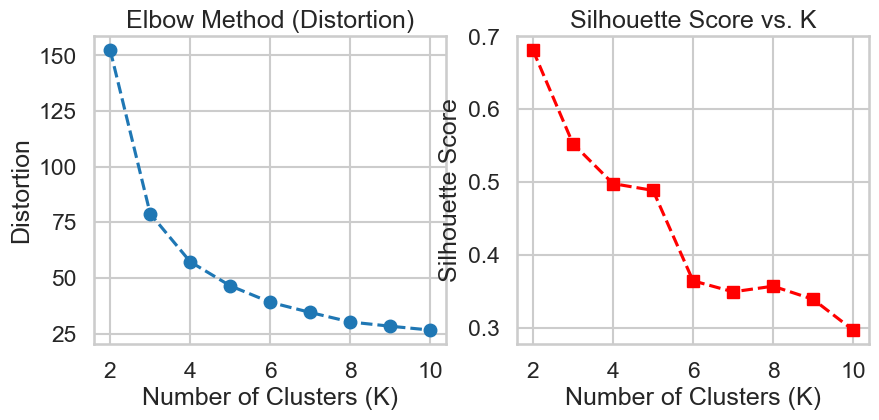

Best K: 2 with Silhouette Score: 0.6810


In [9]:
#KMEAN without scaling
X = iris_data.data  
y_true = iris_data.target  
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

distortions = []
silhouette_scores = []
K_values = range(2, 11) 

for k in K_values:
    kmeans = KMeans(n_clusters=k, init="k-means++", random_state=42, n_init=10)
    y_kmeans = kmeans.fit_predict(X)
    
    # Compute metrics
    distortions.append(kmeans.inertia_)  # Sum of squared distances to centroids
    silhouette_scores.append(silhouette_score(X, y_kmeans))

# Plot Distortion (Elbow Method)
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(K_values, distortions, marker    ='o', linestyle='--')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.title('Elbow Method (Distortion)')

# Plot Silhouette Score vs K
plt.subplot(1, 2, 2)
plt.plot(K_values, silhouette_scores, marker='s', linestyle='--', color='r')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. K')
plt.show()

# Best K based on silhouette score
best_K = K_values[np.argmax(silhouette_scores)]
best_silhouette = max(silhouette_scores)
print(f"Best K: {best_K} with Silhouette Score: {best_silhouette:.4f}")

# Store silhouette score for comparison
best_silhouette_score_kmeans = best_silhouette

By analyzing the elbow method graph, the optimal choice appears to be \( K = 3 \) because the reduction in distortion slows down after this point. Additionally, an online search confirms that the ideal number of clusters for the Iris dataset is 3, supporting the elbow method's suggestion. However, the silhouette score plot peaks at \( K = 2 \) and declines afterward. This means the algorithm selected the best \( K \) based on the silhouette score, which assesses both cluster compactness and separation, making it a more robust metric. While the elbow method pointed to \( K = 3 \) by focusing on cluster variance, the highest silhouette score at \( K = 2 \) suggests that it provides the most well-separated clustering.

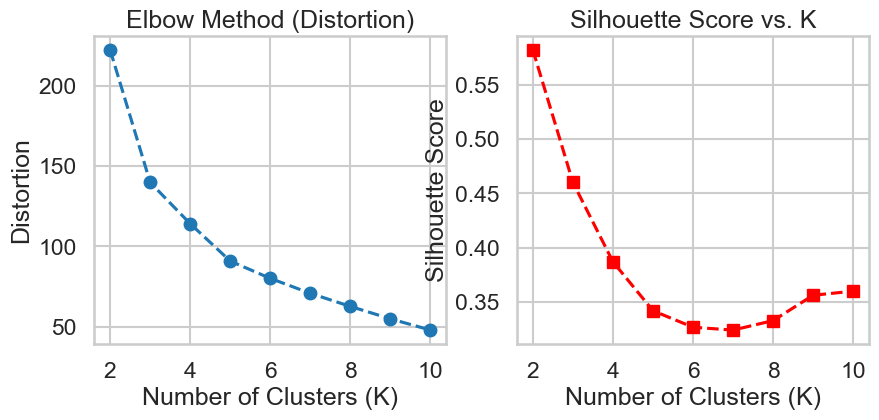

Best K: 2 with Silhouette Score: 0.5818


In [10]:
#kmeans with scaling
X = iris_data.data  # 4 features
y_true = iris_data.target  # True labels
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

distortions = []
silhouette_scores = []
K_values = range(2, 11)  # We start from 2 because silhouette score needs at least 2 clusters

for k in K_values:
    kmeans = KMeans(n_clusters=k, init="k-means++", random_state=42, n_init=10)
    y_kmeans = kmeans.fit_predict(X_scaled)
    
    # Compute metrics
    distortions.append(kmeans.inertia_)  # Sum of squared distances to centroids
    silhouette_scores.append(silhouette_score(X_scaled, y_kmeans))

# Plot Distortion (Elbow Method)
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(K_values, distortions, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.title('Elbow Method (Distortion)')

# Plot Silhouette Score vs K
plt.subplot(1, 2, 2)
plt.plot(K_values, silhouette_scores, marker='s', linestyle='--', color='r')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. K')
plt.show()

# Best K based on silhouette score
best_K = K_values[np.argmax(silhouette_scores)]
best_silhouette = max(silhouette_scores)
print(f"Best K: {best_K} with Silhouette Score: {best_silhouette:.4f}")

# Store silhouette score for comparison
best_silhouette_score_kmeans = best_silhouette

I scaled the df and observed using kmeans method that the number of clusters is still 2 at the highest silhouette score, which means that scaling didn't change the clustering that much, however it decreased the silhouette score slightly indicating that the cluster separation decreased.

Agglomerative Clustering

 Affinity: euclidean, Linkage: ward, Dist_Thresh: 1, Silhouette Score: 0.2822, Clusters: 25
 Affinity: euclidean, Linkage: ward, Dist_Thresh: 2, Silhouette Score: 0.3305, Clusters: 9
 Affinity: euclidean, Linkage: ward, Dist_Thresh: 3, Silhouette Score: 0.3592, Clusters: 6
 Affinity: euclidean, Linkage: ward, Dist_Thresh: 4, Silhouette Score: 0.4844, Clusters: 5
 Affinity: euclidean, Linkage: ward, Dist_Thresh: 5, Silhouette Score: 0.4890, Clusters: 4
 Affinity: euclidean, Linkage: ward, Dist_Thresh: 6, Silhouette Score: 0.4890, Clusters: 4
 Affinity: euclidean, Linkage: complete, Dist_Thresh: 1, Silhouette Score: 0.2554, Clusters: 23
 Affinity: euclidean, Linkage: complete, Dist_Thresh: 2, Silhouette Score: 0.3382, Clusters: 6
 Affinity: euclidean, Linkage: complete, Dist_Thresh: 3, Silhouette Score: 0.4998, Clusters: 4
 Affinity: euclidean, Linkage: complete, Dist_Thresh: 4, Silhouette Score: 0.5136, Clusters: 3
 Affinity: euclidean, Linkage: complete, Dist_Thresh: 5, Silhouette Scor

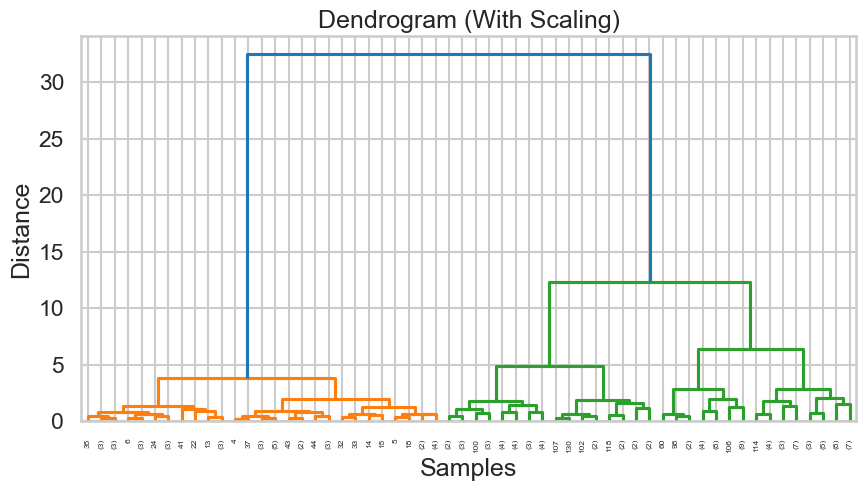

In [11]:
#AgglomerativeClustering
#without scaling


# Define parameter grids
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['ward', 'complete', 'average', 'single']
distance_thresholds = [1,2,3,4,5,6]  # None lets the model decide the number of clusters

best_silhouette = -1
best_params = {}
best_labels = None
best_n_clusters = None  # To store the best number of clusters

# Try all combinations of parameters
for affinity in affinities:
    for linkage_method in linkages:
        for dist_thresh in distance_thresholds:
            if linkage_method == 'ward' and affinity != 'euclidean':
                continue  # Ward only supports Euclidean

            # Agglomerative Clustering
            clustering = AgglomerativeClustering(
                affinity=affinity, linkage=linkage_method, distance_threshold=dist_thresh, n_clusters=None if dist_thresh else 3
            )
            labels = clustering.fit_predict(X)

            # Check if more than one cluster is formed
            unique_labels = np.unique(labels)
            n_clusters = len(unique_labels)
            if n_clusters < 2:
                print(f" Skipping: Only {n_clusters} cluster formed (Affinity: {affinity}, Linkage: {linkage_method}, Dist_Thresh: {dist_thresh})")
                continue

            # Compute silhouette score
            sil_score = silhouette_score(X, labels)
            print(f" Affinity: {affinity}, Linkage: {linkage_method}, Dist_Thresh: {dist_thresh}, Silhouette Score: {sil_score:.4f}, Clusters: {n_clusters}")

            # Store best parameters
            if sil_score > best_silhouette:
                best_silhouette = sil_score
                best_params = {'affinity': affinity, 'linkage': linkage_method, 'distance_threshold': dist_thresh}
                best_labels = labels
                best_n_clusters = n_clusters  # Store the best number of clusters

# Output best parameters and number of clusters
print(f"\n Best Parameters (With Scaling): {best_params} with Silhouette Score: {best_silhouette:.4f}")
print(f" Best Number of Clusters: {best_n_clusters}")

# Plot Dendrogram for one trial
plt.figure(figsize=(10, 5))
Z = linkage(X, method='ward')  # Ward for hierarchy
dendrogram(Z, truncate_mode='level', p=5)
plt.title("Dendrogram (With Scaling)")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.show()




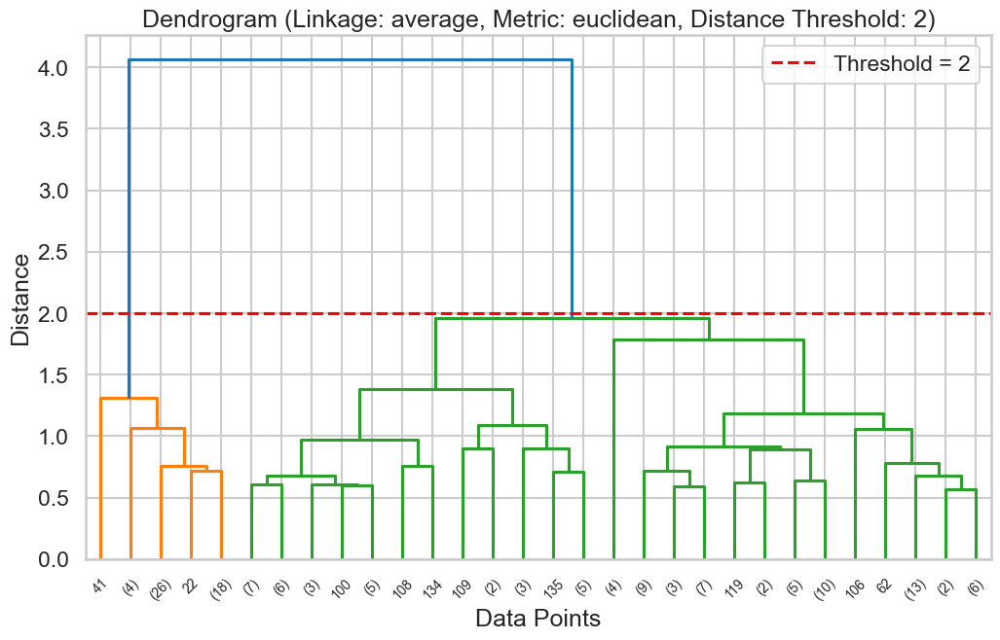

In [12]:

# Plot dendrogram using best parameters
Z = linkage(X, method=best_params['linkage'], metric=best_params['affinity'])

plt.figure(figsize=(12, 7))
plt.title(f"Dendrogram (Linkage: {best_params['linkage']}, Metric: {best_params['affinity']}, Distance Threshold: {best_params['distance_threshold']})")
plt.xlabel("Data Points")
plt.ylabel("Distance")

# Plot dendrogram with color threshold
dendrogram(Z, color_threshold=best_params['distance_threshold'], truncate_mode='lastp')
plt.axhline(y=best_params['distance_threshold'], color='red', linestyle='--', label=f"Threshold = {best_params['distance_threshold']}")
plt.legend()
plt.show()

Hierarchial method gave 2 clusters as well but with slightly higher silhoette score than kmeans without scaling.


In [13]:

#agglomerative with scaling


# Define parameter grids
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['complete', 'average', 'single']
distance_thresholds = [2,3,4,5,6]  # None lets the model decide the number of clusters

best_silhouette = -1
best_params = {}
best_labels = None
best_n_clusters = None  # To store the best number of clusters

# Try all combinations of parameters
for affinity in affinities:
    for linkage_method in linkages:
        for dist_thresh in distance_thresholds:
            if linkage_method == 'ward' and affinity != 'euclidean':
                continue  # Ward only supports Euclidean

            # Agglomerative Clustering
            clustering = AgglomerativeClustering(
                affinity=affinity, linkage=linkage_method, distance_threshold=dist_thresh, n_clusters=None if dist_thresh else 3
            )
            labels = clustering.fit_predict(X_scaled)

            # Check if more than one cluster is formed
            unique_labels = np.unique(labels)
            n_clusters = len(unique_labels)
            if n_clusters < 2:
                print(f" Skipping: Only {n_clusters} cluster formed (Affinity: {affinity}, Linkage: {linkage_method}, Dist_Thresh: {dist_thresh})")
                continue

            # Compute silhouette score
            sil_score = silhouette_score(X_scaled, labels)
            print(f" Affinity: {affinity}, Linkage: {linkage_method}, Dist_Thresh: {dist_thresh}, Silhouette Score: {sil_score:.4f}, Clusters: {n_clusters}")

            # Store best parameters
            if sil_score > best_silhouette:
                best_silhouette = sil_score
                best_params = {'affinity': affinity, 'linkage': linkage_method, 'distance_threshold': dist_thresh}
                best_labels = labels
                best_n_clusters = n_clusters  # Store the best number of clusters

# Output best parameters and number of clusters
print(f"\n Best Parameters (With Scaling): {best_params} with Silhouette Score: {best_silhouette:.4f}")
print(f" Best Number of Clusters: {best_n_clusters}")




 Affinity: euclidean, Linkage: complete, Dist_Thresh: 2, Silhouette Score: 0.3307, Clusters: 11
 Affinity: euclidean, Linkage: complete, Dist_Thresh: 3, Silhouette Score: 0.3107, Clusters: 6
 Affinity: euclidean, Linkage: complete, Dist_Thresh: 4, Silhouette Score: 0.4106, Clusters: 4
 Affinity: euclidean, Linkage: complete, Dist_Thresh: 5, Silhouette Score: 0.4496, Clusters: 3
 Affinity: euclidean, Linkage: complete, Dist_Thresh: 6, Silhouette Score: 0.4408, Clusters: 2
 Affinity: euclidean, Linkage: average, Dist_Thresh: 2, Silhouette Score: 0.3248, Clusters: 6
 Affinity: euclidean, Linkage: average, Dist_Thresh: 3, Silhouette Score: 0.4803, Clusters: 3
 Skipping: Only 1 cluster formed (Affinity: euclidean, Linkage: average, Dist_Thresh: 4)
 Skipping: Only 1 cluster formed (Affinity: euclidean, Linkage: average, Dist_Thresh: 5)
 Skipping: Only 1 cluster formed (Affinity: euclidean, Linkage: average, Dist_Thresh: 6)
 Skipping: Only 1 cluster formed (Affinity: euclidean, Linkage: singl

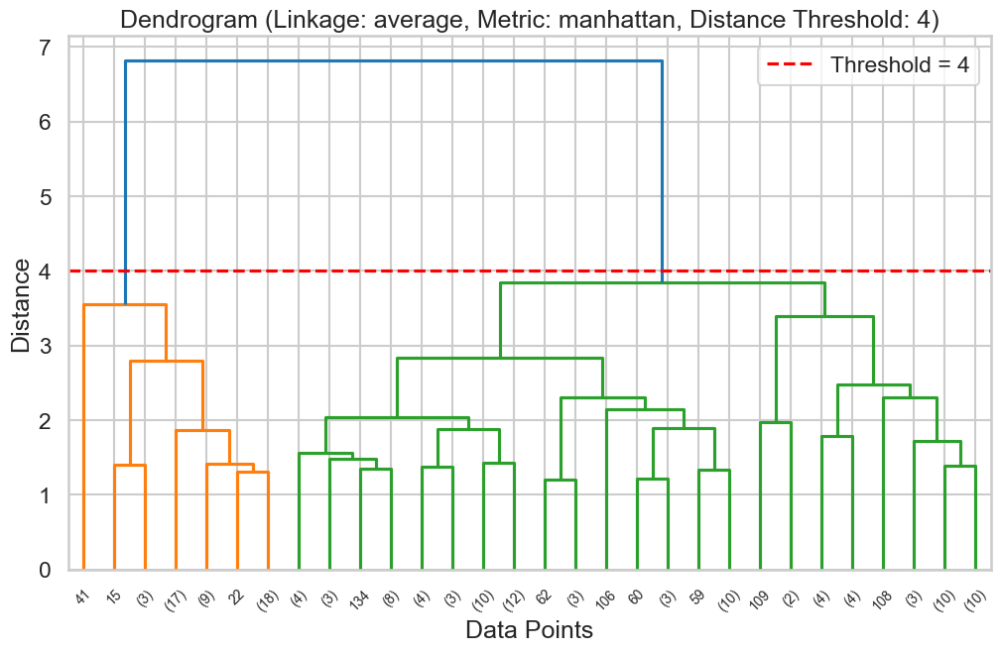

In [14]:
metric = best_params['affinity']
if metric == "manhattan":  
    metric = "cityblock"
# Plot dendrogram using best parameters
Z = linkage(X_scaled, method=best_params['linkage'], metric=metric)

plt.figure(figsize=(12, 7))
plt.title(f"Dendrogram (Linkage: {best_params['linkage']}, Metric: {best_params['affinity']}, Distance Threshold: {best_params['distance_threshold']})")
plt.xlabel("Data Points")
plt.ylabel("Distance")

# Plot dendrogram with color threshold
dendrogram(Z, color_threshold=best_params['distance_threshold'], truncate_mode='lastp')
plt.axhline(y=best_params['distance_threshold'], color='red', linestyle='--', label=f"Threshold = {best_params['distance_threshold']}")
plt.legend()
plt.show()

DBSCAN 

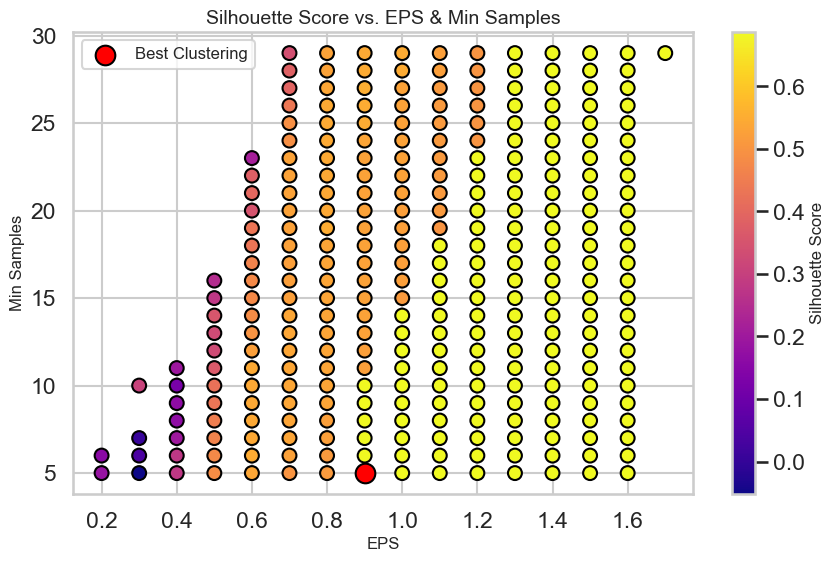

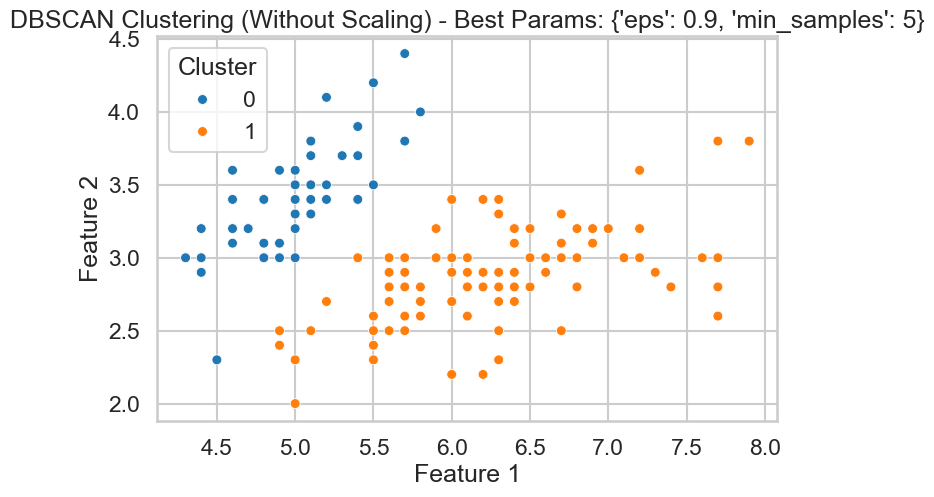


Best Parameters (Without Scaling): {'eps': 0.9, 'min_samples': 5} with Silhouette Score: 0.6867
Best Number of Clusters: 2


In [15]:
#dbscan without scaling

# Define parameter ranges for DBSCAN (without scaling)
eps_values = np.arange(0.1, 3.1, 0.1)  # EPS from 0.1 to 3
min_samples_values = np.arange(5, 30, 1)  # Min_samples from 5 to 25

best_silhouette = -1
best_params = {}
best_labels = None
best_num_clusters = None

# Store lists for plotting
silhouette_scores = []
eps_list = []
min_samples_list = []

# Try all combinations of parameters
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)

        # Ensure more than 1 cluster is formed
        unique_labels = np.unique(labels)
        n_clusters = len(unique_labels) - (1 if -1 in labels else 0)  # Ignore noise (-1)

        if n_clusters < 2:
            continue  # Skip cases with too few clusters

        # Compute silhouette score
        sil_score = silhouette_score(X, labels)
        silhouette_scores.append(sil_score)
        eps_list.append(eps)
        min_samples_list.append(min_samples)

        # Store best parameters
        if sil_score > best_silhouette:
            best_silhouette = sil_score
            best_params = {"eps": eps, "min_samples": min_samples}
            best_labels = labels
            best_num_clusters = n_clusters

# Plot silhouette score vs EPS and Min_samples
plt.figure(figsize=(10, 6))
scatter = plt.scatter(eps_list, min_samples_list, c=silhouette_scores, cmap="plasma", s=100, edgecolors="k")

# Highlight best clustering point
plt.scatter(best_params["eps"], best_params["min_samples"], color="red", s=200, edgecolors="black", label="Best Clustering")

# Labels and title
plt.xlabel("EPS", fontsize=12)
plt.ylabel("Min Samples", fontsize=12)
plt.title("Silhouette Score vs. EPS & Min Samples", fontsize=14)

# Add color bar
cbar = plt.colorbar(scatter)
cbar.set_label("Silhouette Score", fontsize=12)

plt.legend(loc="best", fontsize=12)
plt.grid(True)
plt.show()

# Plot resulting clusters using the best parameters
plt.figure(figsize=(8, 5))
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=best_labels, palette="tab10", s=50)
plt.title(f"DBSCAN Clustering (Without Scaling) - Best Params: {best_params}")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend(title="Cluster")
plt.show()

# Print best parameters and silhouette score
print(f"\nBest Parameters (Without Scaling): {best_params} with Silhouette Score: {best_silhouette:.4f}")
print(f"Best Number of Clusters: {best_num_clusters}")


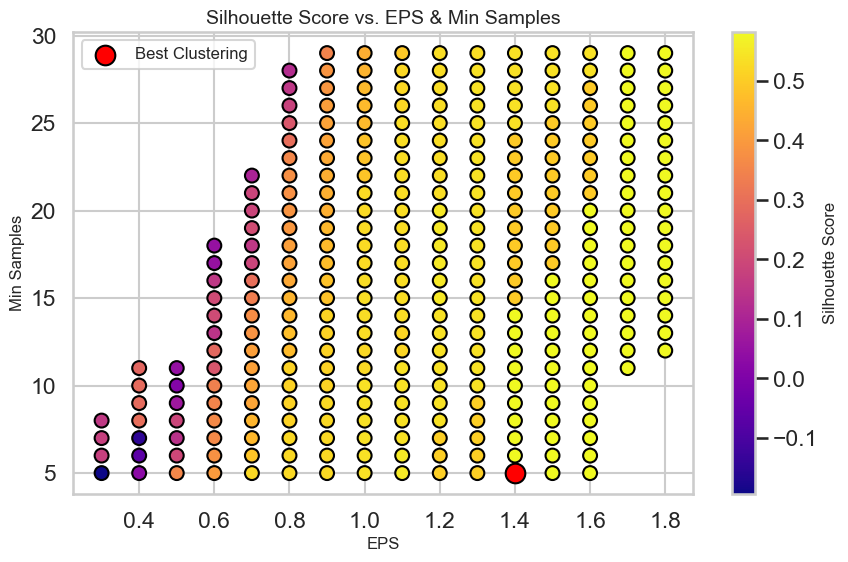

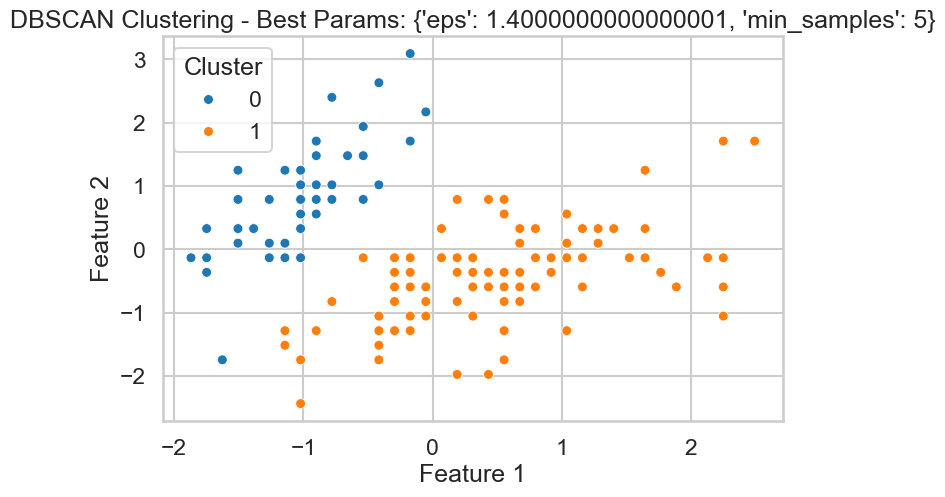


Best Parameters : {'eps': 1.4000000000000001, 'min_samples': 5} with Silhouette Score: 0.5818
Best Number of Clusters: 2


In [16]:
#DBSCAN with scaling


# Define parameter ranges for DBSCAN (without scaling)
eps_values = np.arange(0.1, 3.1, 0.1)  # EPS from 0.1 to 3
min_samples_values = np.arange(5, 30, 1)  # Min_samples from 5 to 25

best_silhouette = -1
best_params = {}
best_labels = None
best_num_clusters = None

# Store lists for plotting
silhouette_scores = []
eps_list = []
min_samples_list = []

# Try all combinations of parameters
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_scaled)

        # Ensure more than 1 cluster is formed
        unique_labels = np.unique(labels)
        n_clusters = len(unique_labels) - (1 if -1 in labels else 0)  # Ignore noise (-1)

        if n_clusters < 2:
            continue  # Skip cases with too few clusters

        # Compute silhouette score
        sil_score = silhouette_score(X_scaled, labels)
        silhouette_scores.append(sil_score)
        eps_list.append(eps)
        min_samples_list.append(min_samples)

        # Store best parameters
        if sil_score > best_silhouette:
            best_silhouette = sil_score
            best_params = {"eps": eps, "min_samples": min_samples}
            best_labels = labels
            best_num_clusters = n_clusters

# Plot silhouette score vs EPS and Min_samples
plt.figure(figsize=(10, 6))
scatter = plt.scatter(eps_list, min_samples_list, c=silhouette_scores, cmap="plasma", s=100, edgecolors="k")

# Highlight best clustering point
plt.scatter(best_params["eps"], best_params["min_samples"], color="red", s=200, edgecolors="black", label="Best Clustering")

# Labels and title
plt.xlabel("EPS", fontsize=12)
plt.ylabel("Min Samples", fontsize=12)
plt.title("Silhouette Score vs. EPS & Min Samples", fontsize=14)

# Add color bar
cbar = plt.colorbar(scatter)
cbar.set_label("Silhouette Score", fontsize=12)

plt.legend(loc="best", fontsize=12)
plt.grid(True)
plt.show()

# Plot resulting clusters using the best parameters
plt.figure(figsize=(8, 5))
sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], hue=best_labels, palette="tab10", s=50)
plt.title(f"DBSCAN Clustering - Best Params: {best_params}")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend(title="Cluster")
plt.show()

# Print best parameters and silhouette score
print(f"\nBest Parameters : {best_params} with Silhouette Score: {best_silhouette:.4f}")
print(f"Best Number of Clusters: {best_num_clusters}")


* Repeat all the above clustering approaches and steps on the above data. 
* Comment on the effect of scaling on clustering this dataset. Show the difference between clustering the data with and without   scaling.
* Compare between the different clustering approaches. 
* Is your clustering outcome consistent with the labels?

# My comments on the results of the Iris dataset

1-For the Iris dataset, DBSCAN, Agglomerative Clustering, and K-Means all performed well, each achieving a Silhouette Score of 0.6867 in some cases. However, an important observation was that scaling affected clustering performance, generally reducing the Silhouette Score to 0.5818. This suggests that the original feature space in the Iris dataset was well-suited for clustering without scaling. DBSCAN performed slightly better here than in the Multi-Blob dataset because it could adapt to the natural density-based separations in the data.

2- Each clustering method has different strengths and weaknesses. K-Means is efficient and works well for spherical clusters, making it an excellent choice for datasets like Multi-Blob where clusters are clearly defined. However, it assumes clusters are convex and may not perform well on datasets with irregularly shaped clusters.

Hierarchical Clustering is useful for small datasets as it provides a clear hierarchical structure of the data. It is particularly helpful for understanding relationships between clusters, but it is less scalable for larger datasets. In both datasets, Agglomerative Clustering performed similarly to K-Means when properly tuned, showing that it can be a viable alternative.

DBSCAN is advantageous in detecting clusters of varying shapes and identifying outliers. It worked well for the Iris dataset, where natural density-based separations exist. However, it struggled with the Multi-Blob dataset, as DBSCAN assumes clusters have varying densities, making it unsuitable for evenly spaced clusters.


3-In the Iris dataset, the clustering outcome was partially consistent with the actual class labels. The dataset consists of three distinct species: Setosa, Versicolor, and Virginica, but clustering methods generally identified only two clusters instead of three.

K-Means and Agglomerative Clustering (both scaled and unscaled) found 2 clusters instead of the expected 3, with the highest Silhouette Score (0.6867). This suggests that the Setosa species was well-separated, while Versicolor and Virginica were clustered together, indicating they are not as distinct in feature space.
DBSCAN also identified 2 clusters, with the best Silhouette Score (0.6867), further supporting the observation that Versicolor and Virginica overlap in the feature space, making them difficult to separate.
This result aligns with previous research on the Iris dataset, where Setosa is linearly separable, while Versicolor and Virginica have overlapping feature distributions, therefore none of the 3 clustering methods work for this dataset.

## Customer dataset
Repeat all the above on the customer data set 

In [17]:
df = pd.read_csv('C:/Users/LENOVO/OneDrive/Desktop/ML Milestone1/Customer Data.csv', index_col= "ID")
df.head()



,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
ID,,,,,,,
100000001,0,0,67,2,124670,1,2
100000002,1,1,22,1,150773,1,2
100000003,0,0,49,1,89210,0,0
100000004,0,0,45,1,171565,1,1
100000005,0,0,53,1,149031,1,1


#we need Min-Max Scaling because it preserves binary values (0 and 1) while scaling the rest of the numerical features 
#between 0 and 1 proportionally without distorting their relationships, while in standard scaling
#binary values would've been altered yielding values that might even be negative.
i also did scaling in general because some values are greater than another so as to prevent feature dominance and ensure all features contribute equally.


K-MEANS

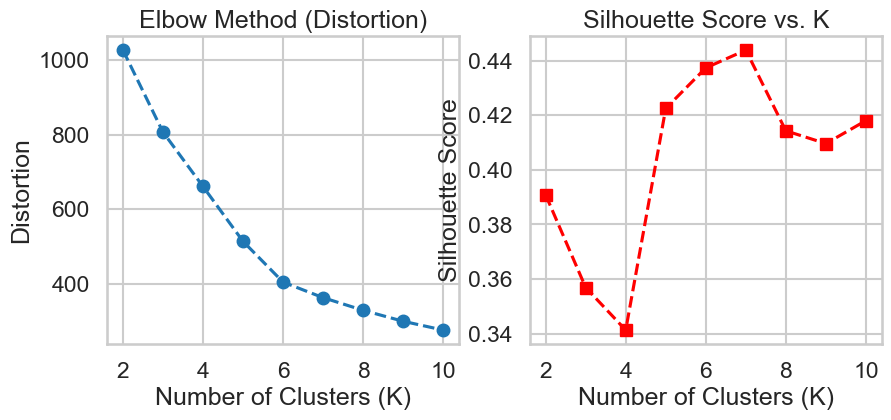

Best K: 7 with Silhouette Score: 0.4438


In [18]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt


# kmeans with scaling
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(df)

distortions = []
silhouette_scores = []
K_values = range(2, 11)  # We start from 2 because silhouette score needs at least 2 clusters

for k in K_values:
    kmeans = KMeans(n_clusters=k, init="k-means++", random_state=42, n_init=10)
    y_kmeans = kmeans.fit_predict(X_scaled)
    
    # Compute metrics
    distortions.append(kmeans.inertia_)  # Sum of squared distances to centroids
    silhouette_scores.append(silhouette_score(X_scaled, y_kmeans))

# Plot Distortion (Elbow Method)
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(K_values, distortions, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion')
plt.title('Elbow Method (Distortion)')

# Plot Silhouette Score vs K
plt.subplot(1, 2, 2)
plt.plot(K_values, silhouette_scores, marker='s', linestyle='--', color='r')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. K')
plt.show()

# Best K based on silhouette score
best_K = K_values[np.argmax(silhouette_scores)]
best_silhouette = max(silhouette_scores)
print(f"Best K: {best_K} with Silhouette Score: {best_silhouette:.4f}")

# Store silhouette score for comparison
best_silhouette_score_kmeans = best_silhouette


AGGLOMERATIVE CLUSTERING

In [19]:

#agglomerative with scaling

# Define parameter grids
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['complete', 'average', 'single']
distance_thresholds = [2,3,4,5]  

best_silhouette = -1
best_params = {}
best_labels = None
best_n_clusters = None  # To store the best number of clusters

# Try all combinations of parameters
for affinity in affinities:
    for linkage_method in linkages:
        for dist_thresh in distance_thresholds:
            if linkage_method == 'ward' and affinity != 'euclidean':
                continue  # Ward only supports Euclidean

            # Agglomerative Clustering
            clustering = AgglomerativeClustering(
                affinity=affinity, linkage=linkage_method, distance_threshold=dist_thresh, n_clusters=None if dist_thresh else 3
            )
            labels = clustering.fit_predict(X_scaled)

            # Check if more than one cluster is formed
            unique_labels = np.unique(labels)
            n_clusters = len(unique_labels)
            if n_clusters < 2:
                #print(f" Skipping: Only {n_clusters} cluster formed (Affinity: {affinity}, Linkage: {linkage_method}, Dist_Thresh: {dist_thresh})")
                continue

            # Compute silhouette score
            sil_score = silhouette_score(X_scaled, labels)
          #  print(f" Affinity: {affinity}, Linkage: {linkage_method}, Dist_Thresh: {dist_thresh}, Silhouette Score: {sil_score:.4f}, Clusters: {n_clusters}")

            # Store best parameters
            if sil_score > best_silhouette:
                best_silhouette = sil_score
                best_params = {'affinity': affinity, 'linkage': linkage_method, 'distance_threshold': dist_thresh}
                best_labels = labels
                best_n_clusters = n_clusters  # Store the best number of clusters



# Output best parameters and number of clusters
print(f"\n Best Parameters (With Scaling): {best_params} with Silhouette Score: {best_silhouette:.4f}")
print(f" Best Number of Clusters: {best_n_clusters}")





 Best Parameters (With Scaling): {'affinity': 'manhattan', 'linkage': 'complete', 'distance_threshold': 4} with Silhouette Score: 0.4004
 Best Number of Clusters: 4


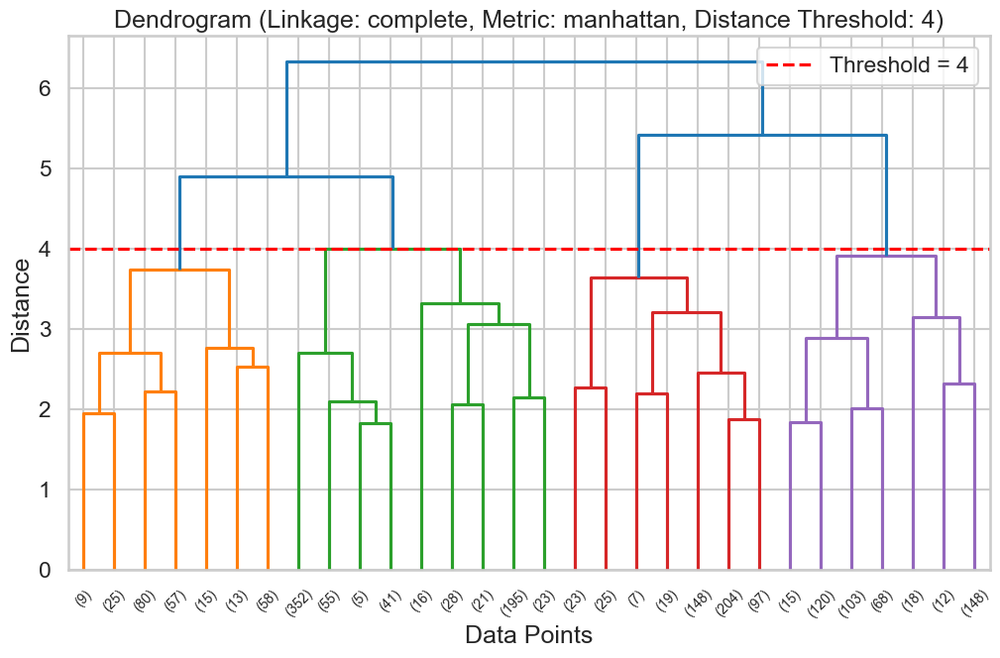

In [20]:
Z = linkage(X_scaled, method=best_params['linkage'], metric=metric)

plt.figure(figsize=(12, 7))
plt.title(f"Dendrogram (Linkage: {best_params['linkage']}, Metric: {best_params['affinity']}, Distance Threshold: {best_params['distance_threshold']})")
plt.xlabel("Data Points")
plt.ylabel("Distance")

# Plot dendrogram with color threshold
dendrogram(Z, color_threshold=best_params['distance_threshold'], truncate_mode='lastp')
plt.axhline(y=best_params['distance_threshold'], color='red', linestyle='--', label=f"Threshold = {best_params['distance_threshold']}")
plt.legend()
plt.show()

The Agglomerative Clustering model, using the best parameters found (Manhattan distance, complete linkage, and a distance threshold of 4), identified 4 clusters with a silhouette score of 0.4004. In contrast, the KMeans clustering method formed 7 clusters and achieved a higher silhouette score of 0.4438, suggesting that the KMeans clusters are more clearly defined.

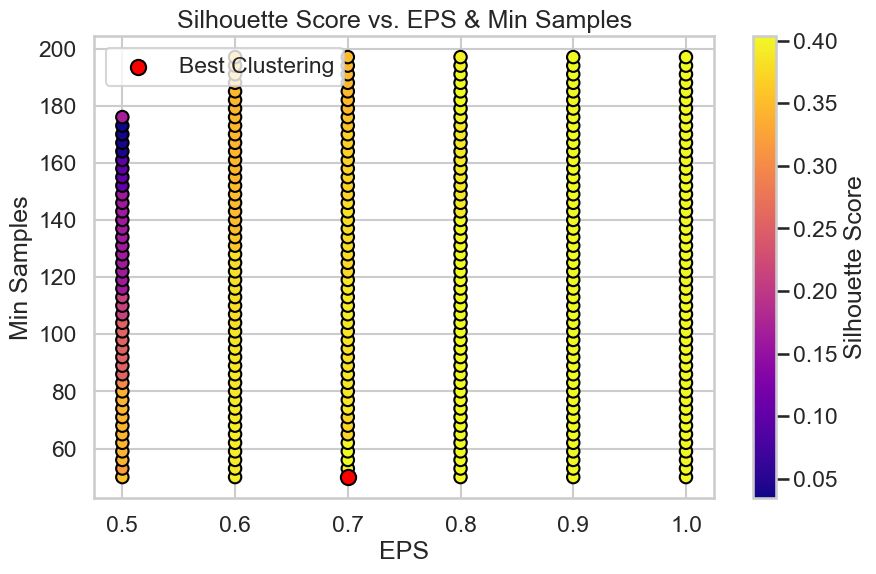


Best Parameters (With Scaling): {'eps': 0.7, 'min_samples': 50} with Silhouette Score: 0.4036
Best Number of Clusters: 4


In [21]:



# Define optimized parameter ranges
eps_values = np.arange(0.5, 2.0, 0.1)  # EPS from 0.5 to 2.0 in steps of 0.1
min_samples_values = np.arange(50, 200, 3)  # Min_samples from 50 to 200 in steps of 3

best_silhouette = -1
best_params = {}
best_labels = None
best_n_clusters = None


# Try selected combinations of parameters
silhouette_scores = []
eps_list = []
min_samples_list = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_scaled)

        # Count number of clusters (excluding noise points labeled -1)
        unique_labels = np.unique(labels)
        n_clusters = len(unique_labels) - (1 if -1 in labels else 0)

        if n_clusters < 2:
            continue  # Skip cases with too few clusters

        # Compute silhouette score
        sil_score = silhouette_score(X_scaled, labels)

        silhouette_scores.append(sil_score)
        eps_list.append(eps)
        min_samples_list.append(min_samples)

        # Store best parameters
        if sil_score > best_silhouette:
            best_silhouette = sil_score
            best_params = {"eps": eps, "min_samples": min_samples}
            best_labels = labels
            best_n_clusters = n_clusters

# Extract best_eps and best_min_samples from best_params
best_eps = best_params.get('eps')
best_min_samples = best_params.get('min_samples')

# Convert lists to arrays for plotting
eps_list = np.array(eps_list)
min_samples_list = np.array(min_samples_list)
silhouette_scores = np.array(silhouette_scores)

# Create scatter plot
plt.figure(figsize=(10, 6))
sc = plt.scatter(eps_list, min_samples_list, c=silhouette_scores, cmap='plasma', edgecolors='black', s=80)

# Highlight the best clustering
plt.scatter(best_eps, best_min_samples, color='red', s=120, edgecolors='black', label="Best Clustering")

# Labels and title
plt.xlabel("EPS")
plt.ylabel("Min Samples")
plt.title("Silhouette Score vs. EPS & Min Samples")
plt.colorbar(sc, label="Silhouette Score")

plt.legend()
plt.show()

# Print best parameters, silhouette score, and number of clusters
print(f"\nBest Parameters (With Scaling): {best_params} with Silhouette Score: {best_silhouette:.4f}")
print(f"Best Number of Clusters: {best_n_clusters}")


The optimal parameters for DBSCAN clustering based on the dataset are:
EPS (epsilon): 0.7
Min Samples: 50

With these parameters, the best clustering solution was achieved, resulting in a Silhouette Score of 0.4036, indicating a moderate level of clustering quality. This score suggests that the clusters are relatively well-formed but may benefit from further fine-tuning of parameters or exploration of alternative clustering methods. This indicates that the clustering structure is not highly distinct, which is often the case when some data points are close to multiple clusters. Such overlap may be due to varying densities 

# Comments on the customer dataset

The three clustering methods yielded different outcomes. KMeans identified 7 clusters as the optimal choice, supported by both the Elbow Method and a Silhouette Score of 0.4438 —the highest among all techniques—indicating well-separated and well-defined clusters. Agglomerative Clustering, using Manhattan distance, complete linkage, and a threshold of 4, resulted in 4 clusters with a silhouette score of 0.4004, suggesting slightly less distinct groupings compared to KMeans. Similarly, DBSCAN, with EPS = 0.7 and Min Samples = 50, also formed 4 clusters but achieved a silhouette score of 0.4036, reflecting some overlap due to variations in density and the presence of noise points. While KMeans had the highest silhouette score, the differences across all methods were relatively small, indicating that although KMeans performed slightly better, Agglomerative Clustering and DBSCAN also provided reasonable results depending on the dataset’s structure. Additionally, the fact that all three silhouette scores were not particularly high suggests that the dataset may not have clearly defined clusters, or that the selected features may not strongly differentiate between groups.